# Problem Set 6: Trees and Forests


In [1]:
%matplotlib inline
import IPython
import pandas as pd
import numpy as np
import IPython
import scipy as sp
import matplotlib
import matplotlib.pyplot as plt
import sklearn
from scipy.stats import ttest_ind
import statsmodels as sm
import statsmodels.formula.api as smf

## Part 1: Exploring the Titanic

Your mission for this problem set is to use your knowledge of supervised machine learning to try to predict which passengers aboard the Titanic were most likely to survive. The prompts for this part of the problem set are deliberately vague - the goal is to leave it up to you how to structure (most of) your analysis.

To get started, read about the prediction problem on [Kaggle](https://www.kaggle.com/c/titanic). Then, download the data [here](https://www.kaggle.com/c/titanic/data) - you'll at the very least need the train.csv data.

### 1.1 Exploratory data analysis

Create 2-3 figures and tables that help give you a feel for the data. Make sure to at least check the data type of each variable, to understand which variables have missing observations, and to understand the distribution of each variable (and determine whether the variables should be normalized or not). Are any of the potential predictor variables (i.e., anything except for survival) collinear or highly correlated? 

In [2]:
# upload training and test data
data_train = pd.read_csv('train.csv')
data_test = pd.read_csv('test.csv')

## gender data
gender_submission= pd.read_csv('gender_submission.csv')

## replace convert gender boolean to numeric values
## Training data
data_train['Sex'] = data_train['Sex'].replace(["female", "male"], [1, 0])
data_train['Embarked'] = data_train['Embarked'].replace(["S", "C","Q"], [ 0,1,2])
## Test data
data_test['Sex'] = data_test['Sex'].replace(["female", "male"], [1, 0])
data_test['Embarked'] = data_test['Embarked'].replace(["S", "C","Q"], [ 0,1,2])
## display training data
print('Training data First dive rows: ')
display(data_train.head())

## display training data
print("")
print('Test data First dive rows: ')
display(data_test.head())


Training data First dive rows: 


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",0,22.0,1,0,A/5 21171,7.2500,NaN,0.0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.0,1,0,PC 17599,71.2833,C85,1.0
2,3,1,3,"Heikkinen, Miss. Laina",1,26.0,0,0,STON/O2. 3101282,7.9250,NaN,0.0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.0,1,0,113803,53.1000,C123,0.0
4,5,0,3,"Allen, Mr. William Henry",0,35.0,0,0,373450,8.0500,NaN,0.0



Test data First dive rows: 


,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",0,34.5,0,0,330911,7.8292,NaN,2
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",1,47.0,1,0,363272,7.0000,NaN,0
2,894,2,"Myles, Mr. Thomas Francis",0,62.0,0,0,240276,9.6875,NaN,2
3,895,3,"Wirz, Mr. Albert",0,27.0,0,0,315154,8.6625,NaN,0
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",1,22.0,1,1,3101298,12.2875,NaN,0


In [3]:
## Display summary of training data
print('Training data types: ')
display(data_train.dtypes)
print('')
print('Training data Summary table: ')
display(data_train.describe())

print(" Data with all non-numeric features")
display(data_train[['Name','Ticket', 'Cabin']].describe())

## Display summary of test data
print('')
print('Test data types: ')
display(data_test.dtypes)
print('')
print('Test data Summary table: ')
display(data_test.describe())
print(" Data with all non-numeric features")
display(data_test[['Name','Ticket', 'Cabin']].describe())

Training data types: 


PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex              int64
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked       float64
dtype: object


Training data Summary table: 


,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
count,891.000000,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000,889.000000
mean,446.000000,0.383838,2.308642,0.352413,29.699118,0.523008,0.381594,32.204208,0.362205
std,257.353842,0.486592,0.836071,0.477990,14.526497,1.102743,0.806057,49.693429,0.636157
min,1.000000,0.000000,1.000000,0.000000,0.420000,0.000000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,0.000000,20.125000,0.000000,0.000000,7.910400,0.000000
50%,446.000000,0.000000,3.000000,0.000000,28.000000,0.000000,0.000000,14.454200,0.000000
75%,668.500000,1.000000,3.000000,1.000000,38.000000,1.000000,0.000000,31.000000,1.000000
max,891.000000,1.000000,3.000000,1.000000,80.000000,8.000000,6.000000,512.329200,2.000000


 Data with all non-numeric features


,Name,Ticket,Cabin
count,891,891,204
unique,891,681,147
top,"Graham, Mrs. William Thompson (Edith Junkins)",347082,G6
freq,1,7,4



Test data types: 


PassengerId      int64
Pclass           int64
Name            object
Sex              int64
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked         int64
dtype: object


Test data Summary table: 


,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
count,418.000000,418.000000,418.000000,332.000000,418.000000,418.000000,417.000000,418.000000
mean,1100.500000,2.265550,0.363636,30.272590,0.447368,0.392344,35.627188,0.464115
std,120.810458,0.841838,0.481622,14.181209,0.896760,0.981429,55.907576,0.685516
min,892.000000,1.000000,0.000000,0.170000,0.000000,0.000000,0.000000,0.000000
25%,996.250000,1.000000,0.000000,21.000000,0.000000,0.000000,7.895800,0.000000
50%,1100.500000,3.000000,0.000000,27.000000,0.000000,0.000000,14.454200,0.000000
75%,1204.750000,3.000000,1.000000,39.000000,1.000000,0.000000,31.500000,1.000000
max,1309.000000,3.000000,1.000000,76.000000,8.000000,9.000000,512.329200,2.000000


 Data with all non-numeric features


,Name,Ticket,Cabin
count,418,418,91
unique,418,363,76
top,"Ryerson, Mrs. Arthur Larned (Emily Maria Borie)",PC 17608,B57 B59 B63 B66
freq,1,5,3


C:\Users\mmoud\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\mmoud\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


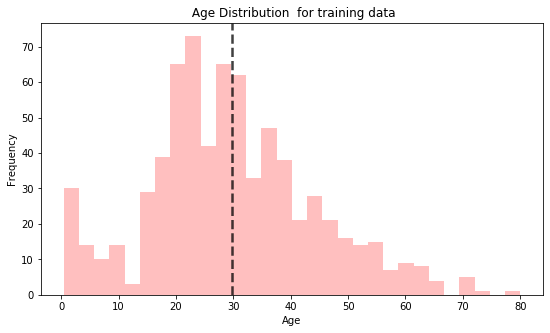

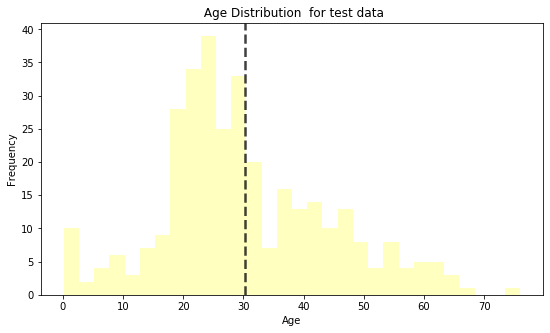

In [4]:
## Exploring  Age distribution for training data

## mean age of training sample
mean_age_train = np.mean(data_train['Age'].dropna())

## mean age of test sample
mean_age_test = np.mean(data_test['Age'].dropna())

## plot Age distribution for training data
## create figure
plt.figure(figsize=(9,5))

## Create labels and title
plt.title(' Age Distribution  for training data')
plt.xlabel('Age')
plt.ylabel('Frequency')

## plot histogram
plt.hist(data_train['Age'].values,bins = 30, color = 'red', alpha = 0.25);
## plot vertical line with average age
plt.axvline(mean_age_train , color = 'k', linestyle = 'dashed', 
            linewidth = 2.5, alpha = 0.75)


## plot Age distribution for training data
## create figure
plt.figure(figsize=(9,5))

## Create labels and title
plt.title(' Age Distribution  for test data')
plt.xlabel('Age')
plt.ylabel('Frequency')

## plot histogram
plt.hist(data_test['Age'].values,bins = 30, color = 'yellow', alpha = 0.25);
## plot vertical line with average age for test
plt.axvline(mean_age_test , color = 'k', linestyle = 'dashed', 
            linewidth = 2.5, alpha = 0.75);

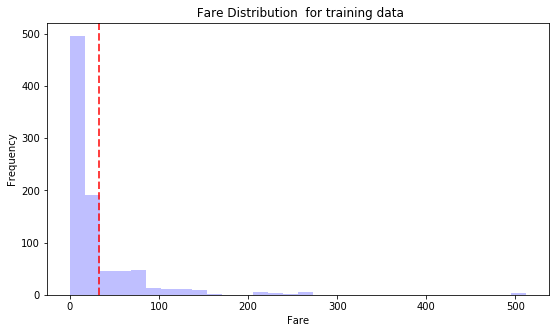

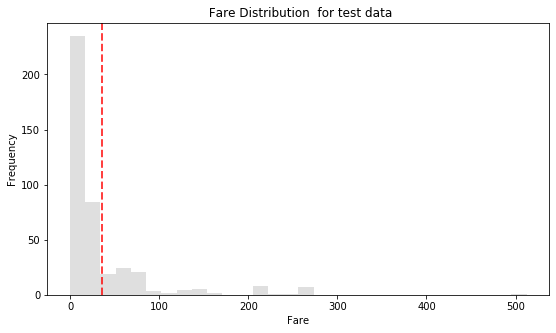

In [5]:
## Exploring  Fare distribution for training data

## mean age of training sample
mean_Fare_train = np.mean(data_train['Fare'].dropna())

## mean age of test sample
mean_Fare_test = np.mean(data_test['Fare'].dropna())

## plot Age distribution for training data
## create figure
plt.figure(figsize=(9,5))

## Create labels and title
plt.title(' Fare Distribution  for training data')
plt.xlabel('Fare')
plt.ylabel('Frequency')

## plot histogram
plt.hist(data_train['Fare'].values,bins = 30, color = 'b', alpha = 0.25);
## plot vertical line with average age
plt.axvline(mean_Fare_train , color = 'r', linestyle = 'dashed', 
            linewidth = 2, alpha = 0.75)


## plot Age distribution for training data
## create figure
plt.figure(figsize=(9,5))

## Create labels and title
plt.title(' Fare Distribution  for test data')
plt.xlabel('Fare')
plt.ylabel('Frequency')

## plot histogram
plt.hist(data_test['Fare'].values,bins = 30, color = 'grey', alpha = 0.25);
## plot vertical line with average age for test
plt.axvline(mean_Fare_test , color = 'r', linestyle = 'dashed', 
            linewidth = 2, alpha = 0.75);

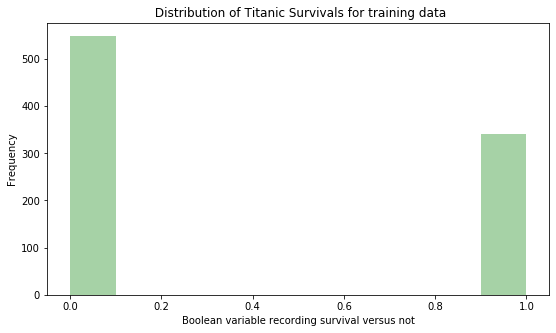

In [6]:
## plot distribution of survivals for training data
## create figure
plt.figure(figsize=(9,5))

## Create labels and title
plt.title(' Distribution of Titanic Survivals for training data')
plt.xlabel('Boolean variable recording survival versus not')
plt.ylabel('Frequency')

## plot histogram
plt.hist(data_train['Survived'].values,color = 'green', alpha = 0.35);

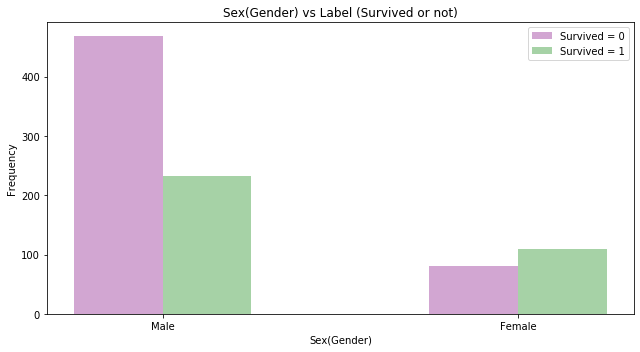

In [7]:
## Bar plots of Number of survivals divided by gender
## Data
data_train_0 = data_train[data_train['Survived']==0]
data_train_1 = data_train[data_train['Survived']==1]
# Gender vs label    
n = 2
index = np.arange(n)
width = 0.25

## Create Figure
plt.figure(figsize = (9,5))

## Plot 
plt.bar(index, data_train_0['Sex'].value_counts(),width,color='purple', label='Survived = 0', alpha = 0.35)
plt.bar(index + width, data_train_1['Sex'].value_counts(),width,color='g', label='Survived = 1', alpha = 0.35)

# Labels, Title, and legends
plt.xlabel('Sex(Gender)')
plt.ylabel('Frequency')
plt.title( 'Sex(Gender) vs Label (Survived or not)')
plt.xticks(index + width/2, ['Male','Female'])
plt.legend()
plt.tight_layout()
   

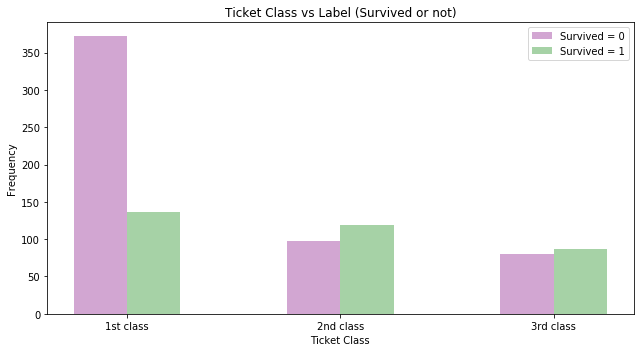

In [8]:
## Bar plots of Number of survivals divided by gender
## Data
data_train_0 = data_train[data_train['Survived']==0]
data_train_1 = data_train[data_train['Survived']==1]
# Ticket class vs label    
n = 3
index = np.arange(n)
width = 0.25

## Create Figure
plt.figure(figsize = (9,5))

## Plot 
plt.bar(index, data_train_0['Pclass'].value_counts(),width,color='purple', label='Survived = 0', alpha = 0.35)
plt.bar(index + width, data_train_1['Pclass'].value_counts(),width,color='g', label='Survived = 1', alpha = 0.35)

# Labels, Title, and legends
plt.xlabel('Ticket Class')
plt.ylabel('Frequency')
plt.title( 'Ticket Class vs Label (Survived or not)')
plt.xticks(index + width/2, ['1st class', '2nd class', '3rd class'])
plt.legend()
plt.tight_layout()
   


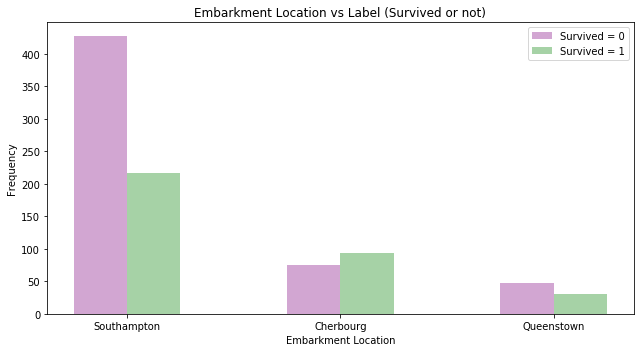

In [9]:
## Bar plots of Number of survivals divided by Embarkment 
## Data   
n = 3
index = np.arange(n)
width = 0.25

## Create Figure
plt.figure(figsize = (9,5))

## Plot 
plt.bar(index, data_train_0['Embarked'].value_counts(),width,color='purple', label='Survived = 0', alpha = 0.35)
plt.bar(index + width, data_train_1['Embarked'].value_counts(),width,color='g', label='Survived = 1', alpha = 0.35)

# Labels, Title, and legends
plt.xlabel('Embarkment Location')
plt.ylabel('Frequency')
plt.title( 'Embarkment Location vs Label (Survived or not)')
plt.xticks(index + width/2, ['Southampton', 'Cherbourg', 'Queenstown'])
plt.legend()
plt.tight_layout()
   

### Discussion:

#### Variables  and data transformations:
The train dataset contains 12 variables: 11 features and 1 binary label ( 𝑆𝑢𝑟𝑣𝑖𝑣𝑒𝑑 ). There are 7 numerical variables and 5 objects/strings:  𝑁𝑎𝑚𝑒 ,  𝑆𝑒𝑥 ,  𝑇𝑖𝑐𝑘𝑒𝑡 ,  𝐶𝑎𝑏𝑖𝑛 , and  𝐸𝑚𝑏𝑎𝑟𝑘𝑒𝑑. The   𝑆𝑒𝑥  and  𝐸𝑚𝑏𝑎𝑟𝑘𝑒𝑑 variables will be converted to numeric values. Sex will be changed to a binary ,(0=male, 1 = female). The embarked variable with replace the strings ("S", "C", "Q") with numeric values (0,1,2).

#### Missing Data
From the above initial data probing, we notice that the variable $Age$ has missing data. We record 714 values out of a total of 891 in the training data and 332 values out of 418 in the test set. Also, the age variable should be notrmanlised because the other relevant variables in the training set have values that average around the order of 1. Whereas the average age values are a magnitude higher. 

In additon the $Cabin$ variables have missing values. For the training data, the $Cabin$  variable has is missing 891-404 = 687 data points which accounts for 77.104 percent of the data. 

#### Data Standardization
In addition, we note that the Age and Fare variables have values of magnitude much larger than the remaining numeric variables. One solution for this could be to standardize by dividing by the max value so we obtain new value that range between 0 and 1.

#### Insights from plots and visualisations
$ Survive$ : We note that the ratio of total deaths to surivors is about 1.5

$Sex$: From the plot of number survived broken by gender, we first note that there are significantly more males than female passengers. In addition, we notice that there seems that number of surivals are significantly less than deaths for male. On the other hand, for females, the survival rate was about the same with a slight preference for survival over death. 


$Pclass$: From the plot of number survived broken by ticket class, we first note that there are significantly more deaths in the 1st class  than the two other ticket classes. In addition, we notice that there seems that number of surivals are significantly less than deaths for 1st class. On the other hand, for the second and third class, the survival rate was about the same with a slight preference for survival over death. 

$Embarkment$: From the plot of number survived broken by Embarkment port, we first note that there are significantly more deaths in the passengers that embarked in Southampton than the two other ports. In addition, we notice that there seems that number of surivals are significantly less than deaths for the passengers that embarked is Southampton . On the other hand, the survival rate was about the same with a slight preference for survival over death for the passengers that embarked in the two other ports.

### 1.2 Correlates of survival

Use whatever methods you can think of to try and figure out what factors seem to determine whether or not a person would survive the sinking of the Titanic. What do you conclude?

In [10]:
## Feature selection using mutual_info_classif from 
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
## data and paramters
X_data = data_train.copy()
## drop target values
X_data = X_data[['PassengerId','Survived','Pclass','Sex','Age','SibSp','Parch','Fare']].dropna()
## convert 
y = X_data['Survived'].copy()
X_data = X_data.drop(['Survived'],axis=1)

## number of features to select( default to select all features)
k = 5
## select the k highest scoring features according to a specified criterion.
selector = SelectKBest(mutual_info_classif, k=k)
X = selector.fit_transform(X_data, y)
# Chosen features selector.get_support()
features = X_data.columns[selector.get_support()]
print('Top five features to select: ', features)

Top five features to select:  Index(['Pclass', 'Sex', 'SibSp', 'Parch', 'Fare'], dtype='object')


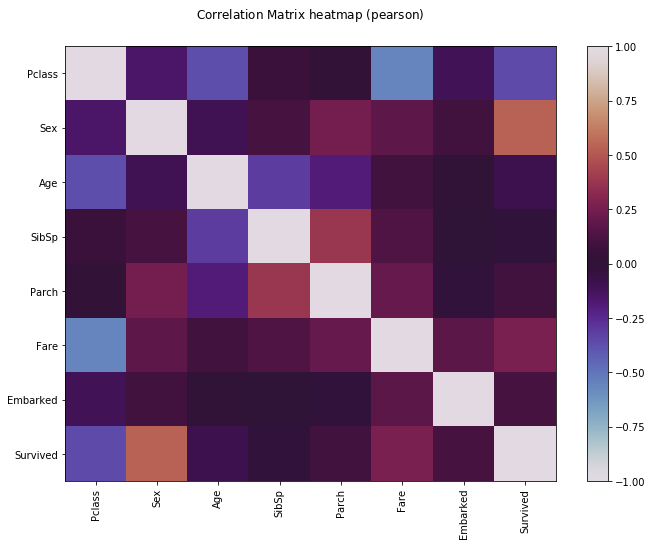

In [11]:
# Creating a correlation map and exctracting highest correlation variables
# Correlation matrix
cols = ["Pclass", "Sex", "Age", "SibSp", 
             "Parch", "Fare", "Embarked", "Survived"]
corr = data_train[cols].dropna().corr()     #Correlation matrix
xlabels = cols
ylabels = cols

## Create figure and axes
fig, ax = plt.subplots(figsize = (11, 8))
ax.set_xticks(np.arange(data_train.shape[1]) + 0.5)
ax.set_yticks(np.arange(data_train.shape[0]) + 0.5)
ax.invert_yaxis()
plt.xticks(rotation = 90)
ax.set_xticklabels(xlabels)
ax.set_yticklabels(ylabels)

# Plot the heatmap and colorbar. Add title
heatmap = plt.pcolor(corr, cmap = 'twilight', 
                     vmin = -1, vmax = corr.max().max())

plt.title(r'$\mathrm{Correlation\ Matrix\ heatmap\ (pearson)}$',
          y = 1.05)
plt.colorbar();

In [12]:
# Analysis: Min and Max (below 1) correlations
corr_min = corr.min().min()
## eliminate the correlations with self with corr_
corr_ = corr[corr < 1]
corr_max = corr_.max().max()
print("Min Correlation: ", corr_min, "Max Correlation: ", corr_max)

# Extract min and max correlations for each variable and store in df
var_corr_mins = pd.DataFrame(corr.min(), columns = ['corr_min'])
var_corr_maxes = pd.DataFrame(corr_.max(), columns = ['corr_max'])

# Get variable names for max/min correlations
print('Variables with minimum correlation: ',end="") 
for i in var_corr_mins[var_corr_mins['corr_min'] == corr_min].index.tolist():
    print( i,end="-")

print('\nVariables with maximum correlation: ',end="") 
for i in var_corr_maxes[var_corr_maxes['corr_max'] == corr_max].index.tolist():
    print( i, end = "-")

Min Correlation:  -0.5528932206457583 Max Correlation:  0.5367616233485013
Variables with minimum correlation: Pclass-Fare-
Variables with maximum correlation: Sex-Survived-

In [13]:
# Print eigen values and eigen vectors to express collinearity
w, v = np.linalg.eig(corr)
print("Eigen values from correlation matrix:\n", w)
print("\nEigen vectors:\n", v)
display(data_train.head())

Eigen values from correlation matrix:
 [2.16555499 1.73884182 1.11801027 0.96810601 0.31451152 0.42508867
 0.70583044 0.56405629]

Eigen vectors:
 [[ 0.45460314 -0.396059    0.22939051 -0.13607752  0.67389594 -0.24783372
   0.20440312  0.08943284]
 [-0.43990691 -0.18734426  0.4730656   0.10848044 -0.22909464 -0.5715826
   0.32053559 -0.2321441 ]
 [-0.03461513  0.56592739 -0.21478986  0.18095175  0.34757865  0.03544797
   0.58973703 -0.36026729]
 [-0.14070905 -0.51155761 -0.4173306  -0.02972274  0.10261614  0.08262358
  -0.15812184 -0.70788577]
 [-0.24995029 -0.45542005 -0.29944835  0.16621269 -0.08514283  0.29648291
   0.56601098  0.44418646]
 [-0.48965804  0.11385153 -0.41555928 -0.03187132  0.40385143 -0.46775616
  -0.28807478  0.32967962]
 [-0.19652142  0.07542079  0.00632189 -0.94737994 -0.04257959  0.09843051
   0.2147895  -0.02205003]
 [-0.48781128 -0.00406352  0.4908061   0.09958279  0.43575294  0.53609891
  -0.18219215 -0.02719625]]


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",0,22.0,1,0,A/5 21171,7.2500,NaN,0.0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.0,1,0,PC 17599,71.2833,C85,1.0
2,3,1,3,"Heikkinen, Miss. Laina",1,26.0,0,0,STON/O2. 3101282,7.9250,NaN,0.0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.0,1,0,113803,53.1000,C123,0.0
4,5,0,3,"Allen, Mr. William Henry",0,35.0,0,0,373450,8.0500,NaN,0.0


### Discussion:
In this section I use two methods : (1) Using mutual_info_classif from the SKLEARN package and (2) Using correlation plots and eigen values.

In method 1, I select the top 5 features using mutual_info_classif from the SKLEARN package. This method measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency. Then we select the top five features with the highest dependencies. From this analysis, I obtain the following results:
- Top five features to select:  Index(['PassengerId', 'Pclass', 'Sex', 'Parch', 'Fare'], dtype='object')

In method two, we calculate the correlation matrix and then find the eigen values and vectors. We obtain the following results from this analysis:

Min Correlation:  -0.5528932206457583 
Max Correlation:  0.5367616233485013
Variables with minimum correlation: Pclass, Fare
Variables with maximum correlation: Sex, Survived


From the two analysis, we note that some relevant features include: 'Pclass', 'Sex', 'Parch' and 'Fare'. I eliminate passenger ID because it does not encode any relevant information in the numbers. 



## Part 2: Decision Trees
### 2.1 Decision Tree
Using the basic [Decision Tree](http://scikit-learn.org/stable/modules/tree.html#tree) library in sklearn, fit a model to predict titanic survival. Make sure you come up with an appropriate way of handling each of the input variables before feeding them in to the decision tree. You can use the [DecisionTreeClassifier](http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier) method to implement 10-fold cross-validation.

For this any the following problems, you should set aside some of your training data as held-out test data, prior to cross-validation. Report the average training and testing accuracy across your 10 folds, and show a diagram of the tree (at least the first three levels). Finally, select the best-performing decision tree (i.e., the one that achieved the highest cross-validated performance) and report the performance of the fitted model on the held-out test data -- how does it compare to the cross-validated accuracy?


In [14]:
from sklearn import tree
from sklearn.model_selection import train_test_split
# Standardize Fare and Age variable and drop irrelevant features (ID, Name, Ticket, and Cabin) 
X_data = data_train.copy()
X_data['Age_std'] = X_data['Age'] / np.max(X_data['Age'])
X_data['Fare_std'] = X_data['Fare']/np.max(X_data['Fare'])
X_data=X_data.drop(["PassengerId", "Name", "Ticket",
                       "Cabin", "Age", "Fare"], axis = 1)
print("Filtered training dataset")
display(X_data.head())

# remove rows with missing data and create train data and labels
X_data_ = X_data.dropna()
print("Original number of observations:", X_data.shape[0])
print("Number of observations (without NaN):", X_data_.shape[0], 
      ", feature size :",  X_data_.shape[0] - 1, " and  single label (Survived)")
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)




# Fit on decision tree 
#with  criterion='entropy', max_depth (for prunning) criterion='entropy',max_depth = 4
model_DT = tree.DecisionTreeClassifier()
model_DT.fit(X_train, Y_train)

# Feature importance and number of leaves and depth
print("")
print("Feature names:", X_train.columns)
print("Features importance:\n", model_DT.feature_importances_)
print("Model number of leaves: ", model_DT.get_n_leaves())
print("Model depth: ",model_DT.get_depth())


## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(model_DT.predict(X_test))
y_hat_train = np.round(model_DT.predict(X_train))

## predicting score
print("Score for training data:",model_DT.score(X = X_train, y = Y_train))
print("Score for test data:",model_DT.score(X = X_test, y = Y_test))



Filtered training dataset


,Survived,Pclass,Sex,SibSp,Parch,Embarked,Age_std,Fare_std
0,0,3,0,1,0,0.0,0.2750,0.014151
1,1,1,1,1,0,1.0,0.4750,0.139136
2,1,3,1,0,0,0.0,0.3250,0.015469
3,1,1,1,1,0,0.0,0.4375,0.103644
4,0,3,0,0,0,0.0,0.4375,0.015713


Original number of observations: 891
Number of observations (without NaN): 712 , feature size : 711  and  single label (Survived)

Feature names: Index(['Pclass', 'Sex', 'SibSp', 'Parch', 'Embarked', 'Age_std', 'Fare_std'], dtype='object')
Features importance:
 [0.1354017  0.28378984 0.04778528 0.02131706 0.03159006 0.24968305
 0.23043301]
Model number of leaves:  140
Model depth:  19
Score for training data: 0.9929701230228472
Score for test data: 0.7692307692307693


In [15]:
# ## Display decision tree
# import graphviz 
# Dtree_data = tree.export_graphviz(model_DT, out_file = None, 
#                          feature_names = X_train.columns,  
#                          class_names = ["Survived", "No Survived"],  
#                          filled = True, rounded = True,  
#                          special_characters = True,
#                          max_depth = 3)  
# graph = graphviz.Source(Dtree_data) 
# graph.render("model_DT") 
# display(graph)

In [16]:
# 10-fold Cross-validation 
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


# storing relevant information
train_accuracy = [0 for i in range(k)] 
test_accuracy = [0 for i in range(k)] 
best_test_acc = 0
best_iter = 0
best_feature_importance = []
tree_list = []

# Niters
niters = 0


# CV loop
kf = KFold(n_splits = k, shuffle = True)
# Generate the sets

for train_index, test_index in kf.split(X):
    
    # Iteration number
    print("------------------------- Iteration", niters + 1, "-------------------------")
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Calling the function
    DT_clf = tree.DecisionTreeClassifier()
    DT_clf = DT_clf.fit(X_train, y_train)
    tree_list.append(DT_clf)

    # Computing Accuracy for test and train set
    # Training Accuracy value
    train_accuracy[niters] = DT_clf.score(X = X_train, y = y_train) 

    # Testing Accuracy value
    test_accuracy[niters]= DT_clf.score(X = X_test, y = y_test) 

    # Best RMSE
    if test_accuracy[niters] > best_test_acc:
        best_test_acc = test_accuracy[niters]
        best_iter = niters
        best_feature_importance  = DT_clf.feature_importances_

        
    
    # Print results
    print("Iteration Results")
    print("-------------------- Accuracy --------------------")
    print("Training set accuracy :", train_accuracy[niters])
    print("Test set accuracy for :", test_accuracy[niters])
    print("--------------------------------------------------")
    
    # Next outer iteration
    niters += 1
# Summary results
print("\n\nSummary 10-fold Cross-validation")
print("---------------------------------------")
print("Mean training Accuracy :", np.mean(train_accuracy))
print("Mean testing Accuracy:", np.mean(test_accuracy))
print("Best Accuracy (test data):", best_test_acc, "on iteration", 
      best_iter + 1)
print("Features importance on best accuracy (test data):\n", 
      best_feature_importance)
print("---------------------------------------")

------------------------- Iteration 1 -------------------------
Iteration Results
-------------------- Accuracy --------------------
Training set accuracy : 0.974609375
Test set accuracy for : 0.5087719298245614
--------------------------------------------------
------------------------- Iteration 2 -------------------------
Iteration Results
-------------------- Accuracy --------------------
Training set accuracy : 0.98046875
Test set accuracy for : 0.43859649122807015
--------------------------------------------------
------------------------- Iteration 3 -------------------------
Iteration Results
-------------------- Accuracy --------------------
Training set accuracy : 0.978515625
Test set accuracy for : 0.47368421052631576
--------------------------------------------------
------------------------- Iteration 4 -------------------------
Iteration Results
-------------------- Accuracy --------------------
Training set accuracy : 0.970703125
Test set accuracy for : 0.526315789473684

In [17]:
### Run experiment on best tree
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

## Best tree indes
i = 6
## best trees
best_tree = tree_list[i]
## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(best_tree.predict(X_test))
y_hat_train = np.round(best_tree.predict(X_train))

## predicting score
print("Score for training data:",best_tree.score(X = X_train, y = Y_train))
print("Score for test data:",best_tree.score(X = X_test, y = Y_test))

Score for training data: 0.5483304042179262
Score for test data: 0.45454545454545453


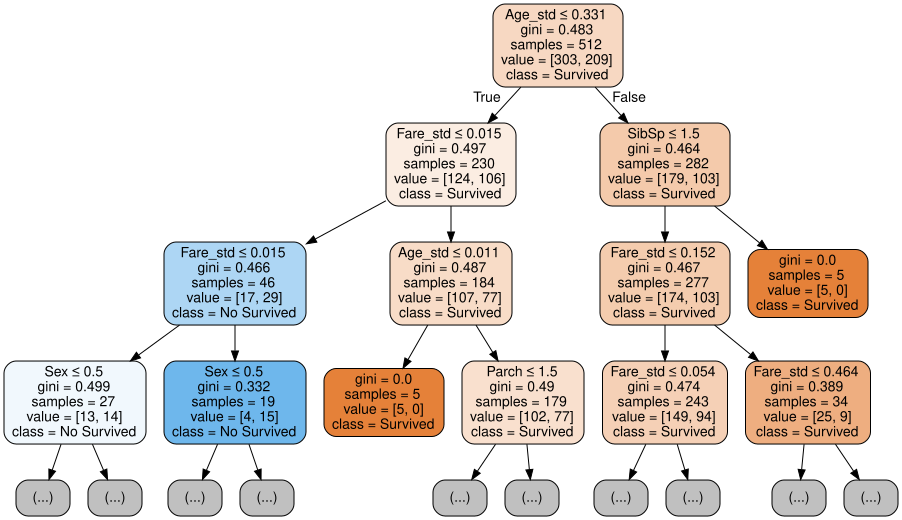

In [18]:
## Display decision tree
import graphviz 
Dtree_data = tree.export_graphviz(best_tree, out_file = None, 
                         feature_names = X_train.columns,  
                         class_names = ["Survived", "No Survived"],  
                         filled = True, rounded = True,  
                         special_characters = True,
                         max_depth = 3)  
graph = graphviz.Source(Dtree_data) 
graph.render("best_tree") 
display(graph)

### Discussion:
#### Report the average training and testing accuracy across your 10 folds, and show a diagram of the tree (at least the first three levels). Finally, select the best-performing decision tree (i.e., the one that achieved the highest cross-validated performance) and report the performance of the fitted model on the held-out test data -- how does it compare to the cross-validated accuracy?

After setting aside 25% of the data, I run a ten fold cross validation using accuracy as a metric and I obtain the following results:
#####  Summary 10-fold Cross-validation

- Mean training Accuracy : 0.9757861994395711
- Mean testing Accuracy: 0.5202694235588973
- Best Accuracy (test data): 0.7017543859649122 on iteration 7
- Features importance on best accuracy (test data):

 
In the figure above , we can see the decision tree with max depth =3. In addition, running the best tree on our test data results in the following accuracies

Score for test data: 0.45454545454545453

In the cross validation, we  accuracies the test  data is pretty low while the training data is very high which may suggest that we are overfitting the model. We could potentially tune some of the hyperparameters such as max_depth to improve accuracy and increasing the complexity of our model byt for instance adding more features to better capture what is happening.

The accuracy of the test data that was set aside is low even for the best tree and there is room for improvement by for instance tuning hyperparameters. 

### Feature importances

From the decision tree model, we can easily obtain the features importance in the table below:


|  Feature | Importance (Decision Tree, default) |
|:--------:|:-----------------------------------:|
|   Pclass |                          0.01968465 |
|      Sex |                          0.05183127 |
|    SibSp |                          0.0414795  |
|    Parch |                          0.04049345 |
| Embarked |                          0.05322659 |
| Fare_std |                          0.35113714 |
|  Age_std |                          0.4421474  |

We notice that the most important variables for the model include the  $Age_std$ and the $Fare_std$ variables. From the analysis the $Fare_std$ variables are relevant in this model. In addition, we note that in this case, the $Age_std$ variable was also important despite it not being relevant in our previous analysis. the $Sex$, and $Pclass$ variables were not relevant contrary to expected results from earlier analysis in sections 1.1 and 1.2. As expected, the remaining variables were not significantly important for the model.

### 2.2 Features

Use all of the data (minus the held-out data) to re-fit a single decision tree with max_depth = 4 (i.e., no cross-validation). Show the tree diagram and also plot the feature importances. What do you observe?

In [60]:
# Fit on best decision tree  from cross validation with entropy 
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

model_DT_1 = tree.DecisionTreeClassifier(max_depth=4)
model_DT_1.fit(X_train, Y_train)

# Feature importance
feature_importance = model_DT_1.feature_importances_
print(feature_importance )
features = X.columns

## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(model_DT_1.predict(X_test))
y_hat_train = np.round(model_DT_1.predict(X_train))

## predicting score
print("Score for training data:",model_DT_1.score(X = X_train, y = Y_train))
print("Score for test data:",model_DT_1.score(X = X_test, y = Y_test))

[0.25307813 0.53533663 0.04981815 0.00080837 0.         0.10703559
 0.05392313]
Score for training data: 0.8347978910369068
Score for test data: 0.8111888111888111


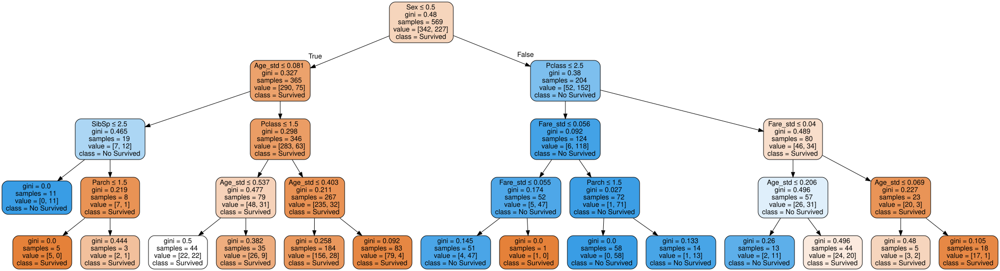

In [20]:
## Display decision tree
Dtree_data = tree.export_graphviz(model_DT_1, out_file = None, 
                         feature_names = X_train.columns,  
                         class_names = ["Survived", "No Survived"],  
                         filled = True, rounded = True,  
                         special_characters = True,
                         max_depth = 4)  
graph = graphviz.Source(Dtree_data) 
graph.render("model_DT_1") 
display(graph)

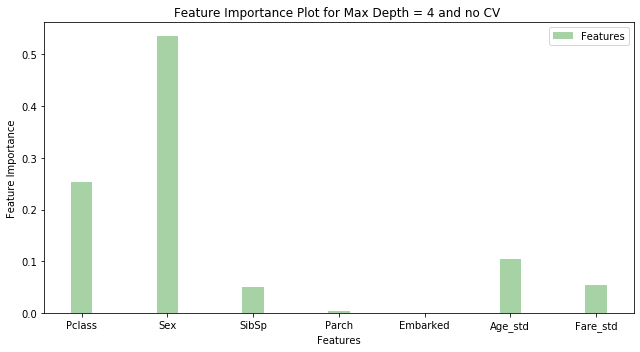

In [21]:
# Feature importance plot
# Figure size
plt.figure(figsize = (9, 5)) 

# Number of bars          
n_groups = len(feature_importance)

# Visual style
index = np.arange(n_groups)
bar_width = 0.25


rects1 = plt.bar(index, feature_importance, bar_width,
                 alpha=0.35, color='g', 
                 label='Features')

# Labels, Title, and legends
plt.xlabel("Features")
plt.ylabel('Feature Importance')
plt.title("Feature Importance Plot for Max Depth = 4 and no CV ")
plt.xticks(index, features)
plt.legend()

plt.tight_layout()
plt.show()

### Discussion:
#### Use all of the data (minus the held-out data) to re-fit a single decision tree with max_depth = 4 (i.e., no cross-validation). Show the tree diagram and also plot the feature importances. What do you observe?

We obtain the following results from the tree:

- Score for training data: 0.8347978910369068
- Score for test data: 0.8111888111888111

### Feature importances

From the decision tree model, we can easily obtain the features importance in the table below:


|  Feature | Importance (Decision Tree, default) | Importance (Decision Tree, MD = 4) |
|:--------:|:-----------------------------------:|:----------------------------------:|
|   Pclass |                          0.01968465 |                         0.25307813 |
|      Sex |                          0.05183127 |                         0.53533663 |
|    SibSp |                          0.0414795  |                         0.04981815 |
|    Parch |                          0.04049345 |                         0.00373522 |
| Embarked |                          0.05322659 |                         0.00000000 |
|  STDFare |                          0.35113714 |                         0.10410874 |
|   STDAge |                          0.4421474  |                         0.05392313 |


We notice that the most important variables for the model include the $Sex$, $Age_std$, the $Fare_std$ and the $Pclass$ variables. From the analysis the $Sex$ , $Pclass$and $Fare_std$ variables are relevant in this model. In addition, we note that in this case, the $Age_std$ variable was also slightly  important despite it not being relevant in our previous analysis. As expected, all the remaining variables were not significantly important for the model.

### 2.3 Tree Tuning
The built-in algorithm you are using has several parameters which you can tune. Using cross-validation, show how the choice of these parameters affects performance.

First, show how max_depth affects train and test accuracy. On a single axis, plot train and test accuracy as a function of max_depth. Use a red line to show test accuracy and a blue line to show train accuracy. Do not use your held-out test data.

Second, show how test accuracy relates to both max_depth and min_samples_leaf. Specifically, create a 3-D plot where the x-axis is max_depth, the y-axis is min_samples_leaf, and the z-axis shows accuracy. What combination of max_depth and min-samples_leaf achieves the highest accuracy? How sensitive are the results to these two parameters?

### Decision tree : 10-fold Cross-validation for both max_depth  hyperparameter only

In [61]:
# 10-fold Cross-validation for max_depth hyperparameter
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


# # Intercept and feature coefficients
# Results = [0 for i in range(0, k)]

## 
max_depths = [i for i in range(1,22)]
# storing relevant information
train_accuracy = [[0 for i in range(k)] for j in range(len(max_depths))]
test_accuracy = [[0 for i in range(k)] for j in range(len(max_depths))] 
mean_train_accs = [0 for j in range(len(max_depths))]
mean_test_accs = [0 for j in range(len(max_depths))]

best_test_acc = 0
best_train_acc = 0
best_max_depth_train = 0
best_max_depth_test = 0
best_mean_test_acc = 0
best_mean_train_acc = 0

best_feature_importance = []

best_iter = 0
best_niter_train= 0
best_niter_test= 0

# Niters
niters = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)
# Generate the sets
for d in max_depths:
    iiters = 0
    best_test_acc = 0
    best_train_acc = 0
    # Iteration number
    print("------------------------- Max depth", d, "-------------------------")
    for train_index, test_index in kf.split(X):
        
    
#         print("d: ",d)
#         print(niters,iiters)
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Calling the function
        DT_clf = tree.DecisionTreeClassifier(max_depth=d,random_state = 0)
        DT_clf = DT_clf.fit(X_train, y_train)

        # Computing Accuracy for test and train set
        # Training Accuracy value
        train_accuracy[niters][iiters] = DT_clf.score(X = X_train, y = y_train) 

        # Testing Accuracy value
        test_accuracy[niters][iiters] = DT_clf.score(X = X_test, y = y_test) 

        # Best RMSE
        if test_accuracy[niters][iiters] > best_test_acc:
            best_test_acc = test_accuracy[niters][iiters]
            best_max_depth = d
            best_iter = iiters
            best_feature_importance  = DT_clf.feature_importances_

        #print(niters,iiters)
        print("CV Iteration Results")
        print("-------------------- Accuracy --------------------")
        print("Training set:", train_accuracy[niters][iiters])
        print("Test set:", test_accuracy[niters][iiters])
        print("--------------------------------------------------")
        ## Next inner iteration
        iiters +=1

    ## Storing mean test and training accuracy values from cv
    mean_test_accs[niters] =  np.mean(test_accuracy[niters])
    mean_train_accs[niters] =  np.mean(train_accuracy[niters])
    print("\n\nSummary 10-fold Cross-validation for max depth", d)
    print("---------------------------------------")
    print("Average Accuracy training:",mean_train_accs[niters])
    print("Average Accuracy testing:", mean_test_accs[niters])
    print("Best Accuracy (test):", best_test_acc, "on iteration", 
          best_iter + 1)
    print("Importance of features best accuracy (test):\n", 
          best_feature_importance)
    print("---------------------------------------\n\n")
    
    # Best AVG accuracy (train & test)
    if mean_train_accs[niters] > best_mean_train_acc:
        best_mean_train_acc = mean_train_accs[niters]
        best_niter_train=  niters
        best_max_depth_train = d
    
    if mean_test_accs[niters] > best_mean_test_acc:
        best_mean_test_acc = mean_test_accs[niters]
        best_niter_test= niters
        best_max_depth_test = d
        
    # Next outer iteration
    niters += 1
# Summary results
print("\n\n Global Results")
print("---------------------------------------")
print("Best Max Depth (training):", max_depths[best_niter_train])
print("Best Accuracy (training):", best_mean_train_acc)
print("Best Max Depth (testing):", max_depths[best_niter_test])
print("Best Accuracy (testing):", best_mean_test_acc)
print("---------------------------------------")

------------------------- Max depth 1 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.611328125
Test set: 0.47368421052631576
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603515625
Test set: 0.5789473684210527
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603515625
Test set: 0.49122807017543857
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6015625
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603515625
Test set: 0.5789473684210527
--------------------------------------------------
CV Iteration Results
-------------------- Accur

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.642578125
Test set: 0.5263157894736842
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.65625
Test set: 0.631578947368421
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.662109375
Test set: 0.5614035087719298
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.646484375
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6484375
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.654296875
Test set: 0.631578947

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7953216374269005
Test set: 0.5357142857142857
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 10
---------------------------------------
Average Accuracy training: 0.77601653874269
Average Accuracy testing: 0.5518170426065162
Best Accuracy (test): 0.6491228070175439 on iteration 2
Importance of features best accuracy (test):
 [0.0404799  0.05476428 0.03583914 0.03259265 0.10417252 0.43501148
 0.29714003]
---------------------------------------


------------------------- Max depth 11 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8359375
Test set: 0.631578947368421
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8359375
Test set: 0.5263157894736842
---------------------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.89453125
Test set: 0.5263157894736842
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.912109375
Test set: 0.43859649122807015
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9453125
Test set: 0.6140350877192983
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.875
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8828125
Test set: 0.6140350877192983
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.873046875
Test set: 0.47368421052

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.890625
Test set: 0.6140350877192983
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.943359375
Test set: 0.43859649122807015
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.96484375
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.919921875
Test set: 0.5087719298245614
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.931640625
Test set: 0.5087719298245614
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.88671875
Test set: 0.45614

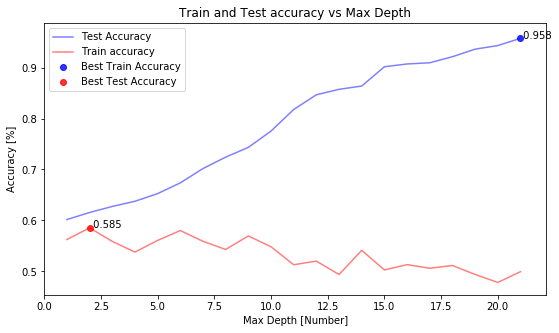

In [23]:
# Figure size
plt.figure(figsize = (9, 5)) 


# axes
ax = plt.subplot(111)                    

# plots
plt.plot(max_depths, mean_train_accs, 'b-', alpha = 0.5, label = "Test Accuracy")
plt.plot(max_depths, mean_test_accs, 'r-', alpha = 0.5, label = "Train accuracy")

plt.scatter(max_depths[best_niter_train], best_mean_train_acc, color = 'b', 
            alpha = 0.8, label = "Best Train Accuracy")

ax.annotate(' ' + str(np.round(best_mean_train_acc, 3)), 
            (max_depths[best_niter_train], best_mean_train_acc))

plt.scatter(max_depths[best_niter_test], best_mean_test_acc, 
            color = 'r', alpha = 0.8, label = "Best Test Accuracy")

ax.annotate(' ' + str(np.round(best_mean_test_acc, 3)), 
            (max_depths[best_niter_test], best_mean_test_acc))

# Labels, Title, and legends
plt.xlabel("Max Depth [Number]")
plt.ylabel('Accuracy [%]')
plt.title("Train and Test accuracy vs Max Depth")
plt.legend();

In [59]:
## test results on best model
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

model_DT_1 = tree.DecisionTreeClassifier(max_depth=2)
model_DT_1.fit(X_train, Y_train)

# Feature importance
feature_importance = model_DT_1.feature_importances_
print(feature_importance )
features = X.columns

## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(model_DT_1.predict(X_test))
y_hat_train = np.round(model_DT_1.predict(X_train))

## predicting score
print("Score for training data:",model_DT_1.score(X = X_train, y = Y_train))
print("Score for test data:",model_DT_1.score(X = X_test, y = Y_test))


[0.24416957 0.68994044 0.         0.         0.         0.06588999
 0.        ]
Score for training data: 0.8066783831282952
Score for test data: 0.7832167832167832


### Decision tree : 10-fold Cross-validation for both max_depth and min-samples_leaf hyperparameters

In [62]:
# 10-fold Cross-validation for both max_depth and min-samples_leaf hyperparameters
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


## Max depth list
max_depths = np.arange(1, 22, 1) 

# MinSampleLeaf
min_sample_leaf = np.arange(1, 101, 1) 

# storing relevant information
train_accuracy = [[[0 for i in range(k)] for j in range(len(max_depths))] for m in range(len(min_sample_leaf ))]
test_accuracy = [[[0 for i in range(k)] for j in range(len(max_depths))] for m in range(len(min_sample_leaf ))]
mean_train_accs = [[0 for j in range(len(max_depths))] for m in range(len(min_sample_leaf ))]
mean_test_accs = [[0 for j in range(len(max_depths))] for m in range(len(min_sample_leaf ))]

best_test_acc = 0
best_train_acc = 0

global_best_test = 0
global_best_test_md = 0
global_best_test_ms = 0

global_best_train = 0
global_best_train_md = 0
global_best_train_ms = 0

best_max_depth_train = 0
best_max_depth_test = 0

best_mean_test_acc = 0
best_mean_train_acc = 0

best_feature_importance = []

best_iter = 0
best_params_iter = 0
best_mditer_train= 0
best_mditer_test= 0

# BestMDMSIter = 0
# BestMDMSTest = 0
# BestMDMSTrain = 0

# Niters
cviter = 0
msiter = 0
mditer = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)

for ms in min_sample_leaf:
    print("------------------------- Min Sample Leaf ", ms, "-------------------------")
    mditer = 0
    for md in max_depths:
        print("------------------------- Max depth", md, "-------------------------")
        cviter = 0
        best_test_acc = 0
        best_train_acc = 0
        ## Create sets for cross validation
        for train_index, test_index in kf.split(X):
            print("------------------ Iteration", cviter + 1, "------------------")
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]

            # Calling the function
            DT_clf = tree.DecisionTreeClassifier(max_depth=md,min_samples_leaf = ms,random_state = 0)
            DT_clf = DT_clf.fit(X_train, y_train)

            # Computing Accuracy for test and train set
            # Training Accuracy value
            train_accuracy[msiter][mditer][cviter] = DT_clf.score(X = X_train, y = y_train) 

            # Testing Accuracy value
            test_accuracy[msiter][mditer][cviter]= DT_clf.score(X = X_test, y = y_test) 

            # Best RMSE
            if test_accuracy[msiter][mditer][cviter] > best_test_acc:
                best_test_acc = test_accuracy[msiter][mditer][cviter]
#                 best_max_depth = md
                best_iter = cviter
                best_mditer = mditer
                best_feature_importance  = DT_clf.feature_importances_

            #print(niters,iiters)
            print("CV Iteration Results")
            print("-------------------- Accuracy --------------------")
            print("Training set:", train_accuracy[msiter][mditer][cviter])
            print("Test set:", test_accuracy[msiter][mditer][cviter])
            print("--------------------------------------------------")
            ## Next cv iteration
            cviter +=1

        ## Storing mean test and training accuracy values from cv
        mean_test_accs[msiter][mditer] =  np.mean(test_accuracy[msiter][mditer])
        mean_train_accs[msiter][mditer] =  np.mean(train_accuracy[msiter][mditer])
        
        print("\n\nSummary 10-fold Cross-validation for max depth", d)
        print("---------------------------------------")
        print("Average Accuracy training:",mean_train_accs[msiter][mditer])
        print("Average Accuracy testing:", mean_test_accs[msiter][mditer])
        print("Best Accuracy (test):", best_test_acc, "on iteration", 
              best_iter + 1)
        print("Importance of features best accuracy (test):\n", 
              best_feature_importance)
        print("---------------------------------------\n\n")

        # Best AVG accuracy (train & test)
        if mean_train_accs[msiter][mditer] > best_mean_train_acc:
            best_mean_train_acc = mean_train_accs[msiter][mditer]
            best_mditer_train = mditer
            global_best_train_md = md
            global_best_train_ms = ms
            best_max_depth_train = md

        if mean_test_accs[msiter][mditer] > best_mean_test_acc:
            best_mean_test_acc = mean_test_accs[msiter][mditer]
            best_mditer_test = mditer
            global_best_test_md = md
            global_best_test_ms = ms
            best_max_depth_test = md

        # Next md  iteration
        mditer += 1
        
     # storing Max Depth results
    print("\n\nSummary Max Depth =", md, "Min Sample leaf =", ms, "Results")
    print("---------------------------------------")
    print("Best Max Depth (training data):", max_depths[best_mditer_train])
    print("Best Accuracy (training data):", best_mean_train_acc)
    print("Best Max Depth (test data):", max_depths[best_mditer_test])
    print("Best Accuracy (test data):", best_mean_test_acc)
    print("---------------------------------------")
    
    # Next ms  iteration
    msiter += 1
        
# Final results
print("\n\nGlobal  Results")
print("---------------------------------------")
print("Best Max Depth (training data):", global_best_train_md)
print("Best Min Sample Leaf (training data):", global_best_train_ms)
print("Best Accuracy (training data):", best_mean_train_acc)
print("Best Max Depth (test data):", global_best_test_md)
print("Best Min Sample Leaf (test data):", global_best_test_ms)
print("Best Accuracy (test data):", best_mean_test_acc)
print("---------------------------------------")

------------------------- Min Sample Leaf  1 -------------------------
------------------------- Max depth 1 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test 

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7207792207792207
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6883116883116883
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6883116883116883
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7705627705627706
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.816017316017316
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8896103896103896
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8441558441558441
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7792207792207793
Test set: 0.3333333333333333
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy t

Training set: 0.8286334056399133
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8221258134490239
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9392624728850325
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9177489177489178
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9588744588744589
Test set: 0.529411764705882

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8937093275488069
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9761904761904762
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9393939393939394
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9588744588744589
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6023401038585421
Average Accuracy testing: 0.5984917043740573
Best Accuracy (test): 0.6538461538461539 on iteration 2
Importance of features best accuracy (test):
 [0. 0. 0. 0. 0. 0. 1.]
---------------------------------------


------------------------- Max depth 2 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6377440347071583
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6774891774891775
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.700870965621508
Average Accuracy testing: 0.5200226244343892
Best Accuracy (test): 0.6730769230769231 on iteration 1
Importance of features best accuracy (test):
 [0.07461077 0.04355457 0.08225024 0.11695147 0.02382421 0.3644319
 0.29437685]
---------------------------------------


------------------------- Max depth 9 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6811279826464208
Test set: 0.6730769230769231
------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7613882863340564
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8398268398268398
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7619047619047619
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7683982683982684
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.854978354978355
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8506493506493507
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8571428571428571
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.854028978974749
Average Accuracy testing: 0.555580693815988
Best Accuracy (test): 0.6470588235

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8698481561822126
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8655097613882863
Test set: 0.7307692307692307
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8741865509761388
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8766233766233766
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7158351409978309
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7006507592190889
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6681127982646421
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6731601731601732
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7489177489177489
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7337662337662337
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7316017316017316
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7554112554112554
Test set: 0.43137254901960786
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accurac

------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8112798264642083
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8286334056399133
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8221258134490239
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7878787878787878
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8441558441558441
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8246753246753247
Test set: 0.43137254901960786
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.8336568348498933
Average Accuracy testing: 0.5262443438914028
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.01595802 0.05186897 0.05634548 0.06075848 0.03946786 0.36248426
 0.41311694]
---------------------------------------


------------------------- Max depth 19 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6789587852494577
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6789587852494577
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796536796536796
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6753246753246753
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7575757575757576
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7943722943722944
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7727272727272727
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.7595787437436028
Average Accuracy testing: 0.5748491704374057
Best Accuracy (test): 0.6923076923076923 on iteration 2
Importance of features best accuracy (test):
 [0.03634181 0.08487265 0.02386905 0.05827053 0.07150984 0.3

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7960954446854663
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7813852813852814
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8138528138528138
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.803030303030303
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8008658008658008
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.8024715703674488
Average Accuracy testing: 0.5670814479638008
Best Accuracy (test): 0.6470588235294118 on iteration 7
Importance of features best accuracy (test):
 [0.04017688 0.02911774 0.04129258 0.04593463 0.08172873 0.37289869
 0.38885074]
---------------------------------------


------------------------- Max depth 21 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8199566160520607
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6274628841873962
Average Accuracy testing: 0.573076923076923
Best Accuracy (test): 0.6538461538461539 on iteration 1
Importance of features best accuracy (test):
 [0.         0.         0.         0.17979524 0.         0.24123278
 0.57897198]
---------------------------------------


------------------------- Max depth 5 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7077922077922078
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7186147186147186
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6926406926406926
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6948051948051948
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7830802603036876
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7830802603036876
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7683982683982684
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7640692640692641
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7748917748917749
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7727272727272727
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7748917748917749
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.7808115239785521
Average Accuracy testing: 0.5497360482654601
Best Accuracy (test): 0.6078431372549019 on iteration 4
Importance of features best accuracy (test):
 [0.043701

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.7450980392156863
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6746203904555315
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7272727272727273
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7056277056277056
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.696969696969697
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.7177935224572969
Average Accuracy testing: 0.5438914027149322
Best Accuracy (test): 0.7115384615384616 on iteration 1
Importance of features best accuracy (test):
 [0.         0.0504883  0.01395688 0.         0.05896253 0.2

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7527114967462039
Test set: 0.6730769230769231
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7700650759219089
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7662337662337663
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7597402597402597
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7505422993492408
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7727272727272727
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7705627705627706
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7532467532467533
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6601731601731602
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6536655679822708
Average Accuracy testing: 0.5479260935143287
Best Accuracy (test): 0.6078431372549019 on iteration 7
Importance of features best accuracy (test):
 [0.11142923 0.11304438 0.03710589 0.14821314 0.08605045 0.2

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7245119305856833
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7396963123644251
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7006507592190889
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7445887445887446
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7744034707158352
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7440347071583514
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7294372294372294
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7337662337662337
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7510822510822511
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7337662337662337
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7402597402597403
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7597402597402597
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7445887445887446
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7575757575757576
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.7470189969105371
Average Accuracy testing: 0.5865384615384616
Best Accuracy (test): 0.7450980392156863 on iteration 6
Importance of features best accuracy (test):
 [0.         0.14441587 0.05671835 0.00896522 0.02404504 0.22988482
 0.53597071]
---------------------------------------




Summary Max Depth = 21 Min Sample leaf = 7 Results
---------------------------------------
Best Max Depth (training data): 21
Best Accuracy (training data): 0.9718502033

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6941431670281996
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6854663774403471
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6984815618221258
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6818181818181818
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.735357917570499
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.720173535791757
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7316017316017316
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7251082251082251
Test set: 0.5294117647058824
--------------------------------------------------
-----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7272727272727273
Test set: 0.39215686274509803
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.7279662131072111
Average Accuracy testing: 0.5129336349924586
Best Accuracy (test): 0.6470588235294118 on iteration 4
Importance of features best accuracy (test):
 [0.02165573 0.06940137 0.03291716 0.05487031 0.06492919 0.27286105
 0.4833652 ]
---------------------------------------


------------------------- Max depth 19 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7310195227765727
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------


CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Trai

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6225596529284165
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6203904555314533
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7012987012987013
Test set: 0.35294117647058826
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7034632034632035
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7121212121212122
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6956780385196872
Average Accuracy testing: 0.49490950226244335
Best Accuracy (test): 0.6274509803921569 on iteration 5
Importance of features best accuracy (test):
 [0.05595993 0.07981633 0.0386514  0.03382577 0.0272924  0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7186147186147186
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.696969696969697
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7229437229437229
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7186147186147186
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7056277056277056
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7142857142857143
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7077922077922078
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7121212121212122
Test set: 0.37254901960784315
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accurac

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Trai

Average Accuracy testing: 0.530316742081448
Best Accuracy (test): 0.6470588235294118 on iteration 7
Importance of features best accuracy (test):
 [0.         0.09085412 0.07416087 0.05099725 0.10550965 0.20854881
 0.4699293 ]
---------------------------------------


------------------------- Max depth 7 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6529284164859002
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.631236442516269
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6529284164859002
Test set: 0.5192307692307693
------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7136659436008677
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7114967462039046
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6991341991341992
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6991341991341992
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7121212121212122
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6904761904761905
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7012987012987013
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6991341991341992
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6941431670281996
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6984815618221258
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6948051948051948
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7012987012987013
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6136025579626446
Average Accuracy testing: 0.5733031674208144
Best Accuracy (test): 0.6862745098039216 on iteration 5
Importance of features best accuracy (test):
 [0.     

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.683982683982684
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6666666666666666
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6883116883116883
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6865974589401921
Average Accuracy testing: 0.5340120663650075
Best Accuracy (test): 0.5769230769230769 on iteration 3
Importance of features best accuracy (test):
 [0.05039276 0.07069773 0.03709515 0.         0.         0.41735928
 0.42445508]
---------------------------------------


------------------------- Max depth 11 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7114967462039046
Test set: 0.34615384615384615
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy ------

Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.696969696969697
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6926406926406926
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6926406926406926
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.696123616080232
Average Accuracy testing: 0.5282051282051282
Best Accuracy (test): 0.63461538

Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6948051948051948
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7012987012987013
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.683982683982684
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7012987012987013
Test set: 0.5686274509803921
-------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6160520607375272
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6247288503253796
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6616052060737527
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6811279826464208
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796536796536796
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6861471861471862
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7034632034632035
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6926561869078138
Average Accuracy testing: 0.49113876319758676
Best Accuracy (test): 0.5686274509803921 on iteration 6
Importance of features best accuracy (test):
 [0.08055758 0.06248462 0.         0.         0.         0.39524777
 0.46171002]
---------------------------------------


------------------------- Max depth 14 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6854663774403471
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6818181818181818
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7012987012987013
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6904761904761905
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.696969696969697
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6507592190889371
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6702819956616052
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.665943600867679
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6666666666666666
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6904761904761905
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6883116883116883
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6774891774891775
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.677276483458696
Average Accuracy testing: 0.4754524886877828
Best Accuracy (test): 0.5576923076923077 on iteration 3
Importance of features best accuracy (test):
 [0.         0.13026962 0.03663736 0.02415139 0.         0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6753246753246753
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6837789108938783
Average Accuracy testing: 0.5207767722473605
Best Accuracy (test): 0.6274509803921569 on iteration 9
Importance of features best accuracy (test):
 [0.02013445 0.18877903 0.02809023 0.05525061 0.         0.36614245
 0.34160322]
---------------------------------------


------------------------- Max depth 16 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6832971800433839
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6948051948051948
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6926406926406926
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.683982683982684
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6829037195631555
Average Accuracy testing: 0.5243212669683258
Best Accuracy (test): 0.6274509803921569 on iteration 6
Importance of features best accuracy (test):
 [0.06070143 0.10105563 0.04034789 0.02383984 0.         0.

------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.4117647058823529
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6702819956616052
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6774891774891775
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6601731601731602
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6753246753246753
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6883116883116883
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6818181818181818
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6904761904761905
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796536796536796
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6753246753246753
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6904761904761905
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6861471861471862
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.683982683982684
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.6538461538461539
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6420824295010846
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6247288503253796
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6637744034707158
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6645021645021645
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6774891774891775
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6705688743649698
Average Accuracy testing: 0.4955505279034691
Best Accuracy (test): 0.6274509803921569 on iteration 7
Importance of features best accuracy (test):
 [0.         0.03489476 0.         0.         0.         0.5026773
 0.46242793]
---------------------------------------


------------------------- Max depth 12 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.670995670995671
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6623376623376623
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6774891774891775
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6731601731601732
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6464208242950108
Test set: 0.4230769230769231
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------------- Max depth 10 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6550976138828634
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6507592190889371
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6594360086767896
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.5294117647058824
--------------------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6774891774891775
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6666666666666666
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6649313087490962
Average Accuracy testing: 0.5240573152337858
Best Accuracy (test): 0.6730769230769231 on iteration 2
Importance of features best accuracy (test):
 [0.         0.04077703 0.0372691  0.         0.         0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6774891774891775
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6623376623376623
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6601731601731602
Test set: 0.37254901960784315
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -----

-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.61038961

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accurac

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6666666666666666
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6623376623376623
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6753246753246753
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6681127982646421
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.3333333333333333
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6666666666666666
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy -------

--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.659521461907579
Average Accuracy testing: 0.4875188536953242
Best Accuracy (test): 0.6078431372549019 on iteration 6
Importance of features best accuracy (test):
 [0.         0.07866966 0.         0.06341208 0.         0.47701917
 0.3808991 ]
---------------------------------------




Summary Max Depth = 21 Min Sample leaf = 17 Results
---------------------------------------
Best Max Depth (training data): 21
Best Accuracy (training data): 0.9718502033035655
Best Max Depth (test data): 1
Best Accuracy (test data): 0.6005656108597286
---------------------------------------
------------------------- Min Sample Leaf  18 -------------------------
------------------------- Max depth 1 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6239978026312083
Average Accuracy testing: 0.5302036199095023
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.         0.09520989 0.03466157 0.         0.         0

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6582227606088777
Average Accuracy testing: 0.5320135746606335
Best Accuracy (test): 0.6078431372549019 on iteration 4
Importance of features best accuracy (test):
 [0.         0.10096947 0.1174585  0.         0.         0.30075066
 0.48082137]
---------------------------------------


------------------------- Max depth 11 -------------------------
------------------ Iteration 1 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6572668112798264
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6529284164859002
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6464208242950108
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6666666666666666
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6571395704801345
Average Accuracy testing: 0.5282805429864252
Best Accuracy (test): 0.6274509803921569 on iteration 6
Importance of features best accuracy (test):
 [0.         0.11275773 0.         0.         0.         0.47122519
 0.41601709]
---------------------------------------


------------------------- Max depth 20 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6042933205623011
Average Accuracy testing: 0.5696078431372549
Best Accuracy (test): 0.7058823529411765 on iteration 5
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.26259186
 0.73740814]
---------------------------------------


------------------------- Max depth 4 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6558441558441559
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6594360086767896
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6681127982646421
Test set: 0.40384615384615385
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.648590021691974
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6023405733817881
Average Accuracy testing: 0.5985294117647058
Best Accuracy (test): 0.6666666666666666 on iteration 8
Importance of features best accuracy (test):
 [0. 0. 0. 0. 0. 0. 1.]
---------------------------------------


------------------------- Max depth 2 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.7115384615384616
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6442516268980477
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6550976138828634
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6399132321041214
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6507592190889371
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6464208242950108
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6594360086767896
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
--------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.610354396146153
Average Accuracy testing: 0.5518476621417798
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.         0.06871891 0.08722103 0.         0.         0.3

-------------------- Accuracy --------------------
Training set: 0.6601731601731602
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.652804931872177
Average Accuracy testing: 0.520475113122172
Best Accuracy (test): 0.6862745098039216 on iteration 4
Importance of features best accuracy (test):
 [0.03682439 0.12642416 0.03935907 0.07548199 0.         0.49692329
 0.2249871 ]
---------------------------------------


------------------------- Max depth 10 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training

--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.49019607843137253
--------------------------------------------------
-------

------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6507592190889371
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6420824295010846
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.35294117647058826
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iterati

---------------------------------------
Average Accuracy training: 0.6023401038585421
Average Accuracy testing: 0.5888009049773755
Best Accuracy (test): 0.6862745098039216 on iteration 5
Importance of features best accuracy (test):
 [0.43902906 0.         0.         0.         0.         0.
 0.56097094]
---------------------------------------


------------------------- Max depth 3 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.6730769230769231
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy ------------------

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6404597571625772
Average Accuracy testing: 0.5145927601809954
Best Accuracy (test): 0.6153846153846154 on iteration 3
Importance of features best accuracy (test):
 [0.         0.06434405 0.         0.         0.0172184  0.55217212
 0.36626543]
---------------------------------------


------------------------- Max depth 8 -------------------------
------------------ Iteration 1 ------------------
CV Itera

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6601731601731602
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6688311688311688
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6334056399132321
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6464208242950108
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6399132321041214
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.65

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6471762871979793
Average Accuracy testing: 0.5420437405731523
Best Accuracy (test): 0.6274509803921569 on iteration 6
Importance of features best accuracy (test):
 [0.26293532 0.07272641 0.06360912 0.         0.         0.35946984
 0.24125931]
---------------------------------------


------------------------- Max depth 16 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6399132321041214
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658008658008658
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6456573794968589
Average Accuracy testing: 0.5322398190045249
Best Accuracy (test): 0.6470588235294118 on iteration 10
Impo

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.640023100543708
Average Accuracy testing: 0.5472473604826547
Best Accuracy (test): 0.6730769230769231 on iteration 2
Importance of features best accuracy (test):
 [0.06353578 0.05757568 0.         0.         0.         0.53315628
 0.34573227]
---------------------------------------


------------------------- Max depth 9 -------------------------
------------------ Iteration 1 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

Training set: 0.6428571428571429
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6623376623376623
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6645021645021645
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.49019607843137

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6225596529284165
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6426247288503254
Average Accuracy testing: 0.530316742081448
Best Accuracy (test): 0.6470588235294118 on iteration 4
Importance of features best accuracy (test):
 [0.         0.07653536 0.         0.         0.         0.5002968
 0.42316784]
---------------------------------------


------------------------- Max depth 12 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6439262472885032
Average Accuracy testing: 0.5557692307692308
Best Accuracy (test): 0.6470588235294118 on iteration 9
Importance of features best accuracy (test):
 [0.07648171 0.04836457 0.         0.         0.         0.44961499
 0.42553874]
---------------------------------------


------------------------- Max depth 17 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6594360086767896
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6623376623376623
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.4117647058823529
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6413250885051318
Average Accuracy testing: 0.5455882352941177
Best Accuracy (test): 0.6666666666666666 on iteration 5
Importance of features best accuracy (test):
 [0.         0.01835485 0.04975875 0.         0.         0.49280725
 0.43907914]
---------------------------------------




Summary Max Depth = 21 Min Sample leaf = 25 Results
---------------------------------------
Best Max Depth (training data

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6399132321041214
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6334056399132321
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6666666666666666
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6034232939872852
Average Accuracy testing: 0.5810708898944192
Best Accuracy (test): 0.6862745098039216 on iteration 5
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.6

-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6411109859049121
Average Accuracy testing: 0.5360482654600303
Best Accuracy (test): 0.5882352941176471 on iteration 5
Importance of features best accuracy (test):
 [0.         0.18746312 0.         0.         0.         0.43564469
 0.37689219]

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6400287348226611
Average Accuracy testing: 0.539819004524887
Best Accuracy (test): 0.6274509803921569 on iteration 4
Importance of features best accuracy (test):
 [0.         0.19552957 0.         0.         0.         0.2

Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.47058823529411764
------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6377440347071583
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.648590021691974
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6380759876421481
Average Accuracy testing: 0.541553544494721
Best Accuracy (test): 0.6470588235294118 on iteration 5
Importance of features best accuracy (test):
 [0.17727054 0.06478353 0.         0.         0.         0.38832553
 0.3696204 ]
---------------------------------------


------------------------- Max depth 12 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6442516268980477
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Ite

------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6402433069461269
Average Accuracy testing: 0.5225490196078432
Best Accuracy (test): 0.5882352941176471 on iteration 9
Importance of features best accuracy (test):
 [0.073718

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6529284164859002
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6558441558441559
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tr

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6160520607375272
Test set: 0.6730769230769231
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6348282953489027
Average Accuracy testing: 0.5146681749622926
Best Accuracy (test): 0.5882352941176471 on iteration 9
Importance of features best accuracy (test):
 [0.00749446 0.08617882 0.09452494 0.         0.         0.28520564
 0.52659615]
---------------------------------------


------------------------- Max depth 10 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6442516268980477
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6493506493506493
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6356917485984732
Average Accuracy testing: 0.5262820512820513
Best Accuracy (test): 0.6153846153846154 on iteration 3
Importance of features best accuracy (test):
 [0.26567771 0.09469281 0.         0.         0.03482442 0.34014669
 0.26465837]
---------------------------------------


------------------------- Max depth 8 -------------------------
------------------ Iteration 1 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.7254901960784313
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6367796339596774
Average Accuracy testing: 0.557843137254902
Best Accuracy (test): 0.7254901960784313 on iteration 10
Importance of features best accuracy (test):
 [0.         0.07447993 0.         0.         0.         0.47199404
 0.45352603]
---------------------------------------




Summary Max Depth = 21 Min Sample leaf = 30 Results
---------------------------------------
Best Max Depth (training data): 21
Best Accuracy (training data): 0.9718502033

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.631236442516269
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.631236442516269
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6302804931872177
Average Accuracy testing: 0.5436651583710408
Best Accuracy (test): 0.6346153846153846 on iteration 2
Importance of features best accuracy (test):
 [0.         0.06411678 0.         0.07025634 0.         0.34109859
 0.52452829]
---------------------------------------


------------------------- Max depth 20 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6334056399132321
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Trainin

------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iterat

 [0.         0.1407426  0.0900342  0.         0.         0.25181709
 0.5174061 ]
---------------------------------------


------------------------- Max depth 8 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6247288503253796
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6247288503253796
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.648590021691974
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------

Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6294123447051863
Average Accuracy testing: 0.5341251885369533
Best Accuracy (test): 0.6470588235294118 on iteration 9
Importance of features best accuracy (test):
 [0.22555196 0.14501432 0.         0.0525993  0.         0.40080552
 0.1760289 ]
---------------------------------------


------------------------- Max depth 13 --

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6296353682470819
Average Accuracy testing: 0.5518099547511313
Best Accuracy (test): 0.6666666666666666 on iteration 6
Importance of features best accuracy (test):
 [0.09965706 0.02668813 0.         0.         0.         0.1

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6160520607375272
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy -----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.630933130499291
Average Accuracy testing: 0.5224358974358975
Best Accuracy (test): 0.6274509803921569 on iteration 5
Importance of features best accuracy (test):
 [0.         0.10077278 0.10301161 0.         0.         0.25299008
 0.54322552]
---------------------------------------


------------------------- Max depth 11 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6311486416692491
Average Accuracy testing: 0.5012443438914027
Best Accuracy (test): 0.5686274509803921 on iteration 9
Importance of features best accuracy (test):
 [0.         0.06177773 0.         0.         0.         0.5

Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.43137254901960786
---------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6442516268980477
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6334056399132321
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6263792245354068
Average Accuracy testing: 0.5419683257918552
Best Accuracy (test): 0.6346153846153846 on iteration 1
Importance of features best accuracy (test):
 [0.         0.         0.         0.1065498  0.         0.45612173
 0.43732847]
---------------------------------------


------------------------- Max depth 14 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.648590021691974
Test set: 0.38461538461538464
--------------------------------------------------
------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6261651219351869
Average Accuracy testing: 0.5262820512820513
Best Accuracy (test): 0.6274509803921569 on iteration 7
Importance of features best accuracy (test):
 [0.11036938 0.08625417 0.         0.         0.         0.2

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6160520607375272
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

-------------------- Accuracy --------------------
Training set: 0.6536796536796536
Test set: 0.3333333333333333
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.4117647058823529
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6302762674780029
Average Accuracy testing: 0.5318627450980393
Best Accuracy (test): 0.6538461538461539 on iteration 1
Importance of features best accuracy (test):
 [0.         0.06233717 0.         0.         0.         0.49042015
 0.44724268]
---------------------------------------


------------------------- Max depth 12 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Traini

------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6252974429764018
Average Accuracy testing: 0.5436274509803922
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.         0.0634129  0.         0.         0.         0.45273843
 0.48384867]
---------------------------------------


------------------------- Max depth 17 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6285465438393856
Average Accuracy testing: 0.5322021116138763
Best Accuracy (test): 0.5882352941176471 on iteration 8
Importance of features best accuracy (test):
 [0.08337588 0.12458508 0.         0.         0.         0.3

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6471861471861472
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6399132321041214
Test set: 0.38461538461538464
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6377440347071583
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy -------

-------------------- Accuracy --------------------
Training set: 0.645021645021645
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6252974429764017
Average Accuracy testing: 0.5517345399698341
Best Accuracy (test): 0.6666666666666666 on iteration 4
Importance of features best accuracy (test):
 [0.         0.07142786 0.         0.12871878 0.         0.1459257
 0.65392767]
---------------------------------------


------------------------- Max depth 20 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6420824295010846
Test set: 0.40384615384615385
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Trainin

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6038543163272013
Average Accuracy testing: 0.5711915535444947
Best Accuracy (test): 0.6666666666666666 on iteration 8
Importance of features best accuracy (test):
 [0.         0.18517748 0.         0.         0.         0.
 0.81482252]
---------------------------------------


------------------------- Max depth 4 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ---------------

Training set: 0.6277056277056277
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.568627450980

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6203904555314533
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6281141129297311
Average Accuracy testing: 0.5577300150829563
Best Accuracy (test): 0.5882352941176471 on iteration 4
Importance of features best accuracy (test):
 [0.28229428 0.13465689 0.         0.         0.         0.25942556
 0.32362327]
---------------------------------------


------------------------- Max depth 18 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.631236442516269
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------

-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Trainin

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6334056399132321
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6247288503253796
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tr

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6140331107793147
Average Accuracy testing: 0.5536576168929109
Best Accuracy (test): 0.6274509803921569 on iteration 7
Importance of features best accuracy (test):
 [0.43929436 0.17655584 0.         0.         0.         0.07756918
 0.30658063]
---------------------------------------


------------------------- Max depth 5 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -------

------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6442516268980477
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6023415124282804
Average Accuracy testing: 0.5868401206636501
Best Accuracy (test): 0.7058823529411765 on iteration 4
Importance of features best accuracy (test):
 [0. 0. 0. 0. 0. 0. 1.]
---------------------------------------


------------------------- Max depth 3 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.40384615384615385
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 

------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6247288503253796
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6203904555314533
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.43137254901960786
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6242133138011663
Average Accuracy testing: 0.5145927601809955
Best Accuracy (test): 0.6470588235294118 on iteration 8
Importance of features best accuracy (test):
 [0.         0.05367514 0.         0.         0.         0.63155535
 0.31476951]
---------------------------------------


------------------------- Max depth 13 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ----

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Itera

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6399132321041214
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.47058823529411764
--------------------------------------------------
--------

--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6320346320346321
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6255148322393442
Average Accuracy testing: 0.545814479638009
Best Accuracy (test): 0.6274509803921569 on iteration 5
Importance of features best accuracy (test):
 [0.39704887 0.11389008 0.         0.         0.         0.08485584
 0.40420521]
---------------------------------------


------------------------- Max depth 11 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.5384615384615384
--------------------------------------------------
-------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6406926406926406
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6225596529284165
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6428571428571429
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6034214158943009
Average Accuracy testing: 0.5672699849170437
Best Accuracy (test): 0.6274509803921569 on iteration 7
Importance of features best accuracy (test):
 [0.         0.23229056 0.         0.         0.         0.
 0.76770944]
---------------------------------------


------------------------- Max depth 4 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ---------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6235639631518157
Average Accuracy testing: 0.528054298642534
Best Accuracy (test): 0.6730769230769231 on iteration 3
Importance of features best accuracy (test):
 [0.         0.15932288 0.11119786 0.         0.         0.2

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.39215686274509803
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6363636363636364
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.7115384615384616
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6244278859246322
Average Accuracy testing: 0.5207767722473605
Best Accuracy (test): 0.6274509803921569 on iteration 4
Importance of features best accuracy (test):
 [0.         0.08026704 0.         0.         0.         0.43152989
 0.48820308]
---------------------------------------


------------------------- Max depth 12 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515151515151515
Test set: 0.3137254901960784
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.7254901960784313
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6265966137983493
Average Accuracy testing: 0.522473604826546
Best Accuracy (test): 0.7254901960784313 on iteration 9
Importance of features best accuracy (test):
 [0.         0.07428518 0.         0.         0.         0.53

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6160520607375272
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6226948756232921
Average Accuracy testing: 0.5594268476621418
Best Accuracy (test): 0.6538461538461539 on iteration 1
Importance of features best accuracy (test):
 [0.         0.11790938 0.         0.         0.         0.1149769
 0.76711371]
---------------------------------------


------------------------- Max depth 15 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.38461538461538464
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6203904555314533
Test set: 0.4807692307692308
--------------------------------------------------
-------

Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.7254901960784313
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6203125146726014
Average Accuracy testing: 0.5729638009049773
Best Accuracy (test): 0.725490

------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iterati

Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.6274509803921569
------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6237804133682658
Average Accuracy testing: 0.553921568627451
Best Accuracy (test): 0.6274509803921569 on iteration 7
Importance of features best accuracy (test):
 [0.         0.0766697  0.09397436 0.         0.         0.2

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6290672451193059
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6218342395131983
Average Accuracy testing: 0.5402337858220211
Best Accuracy (test): 0.6274509803921569 on iteration 10
Importance of features best accuracy (test):
 [0.10949569 0.10525189 0.         0.         0.         0.06919316
 0.71605925]
---------------------------------------


------------------------- Max depth 19 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6277056277056277
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iterat

Training set: 0.6060606060606061
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6164206364857125
Average Accuracy testing: 0.5496606334841629
Best Accuracy (test): 0.7307692307692307 on iteration 2
Importance of features best accuracy (test):
 [0.         0.10713311 0.         0.06308972 0.         0.37543773
 0.45433945]
---------------------------------------


---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6420824295010846
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6341991341991342
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6355748373101953
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6160520607375272
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6225596529284165
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6157637734644242
Average Accuracy testing: 0.4831825037707391
Best Accuracy (test): 0.5961538461538461 on iteration 3
Importance of features best accuracy (test):
 [0.         0.         0.09790866 0.         0.         0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6148979725986233
Average Accuracy testing: 0.5360482654600303
Best Accuracy (test): 0.6274509803921569 on iteration 4
Importance of features best accuracy (test):
 [0.14758426 0.         0.         0.         0.         0.24115689
 0.61125885

-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.37254901960784315
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training 

-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6203904555314533
Test set: 0.40384615384615385
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6385281385281385
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6157726944061002
Average Accuracy testing: 0.5534313725490196
Best Accuracy (test): 0.6346153846153846 on iteration 2
Importance of features best accuracy (test):
 [0.42677134 0.12613556 0.         0.         0.         0.

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6247288503253796
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6212121212121212
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6164131241137748
Average Accuracy testing: 0.5416666666666666
Best Accuracy (test): 0.6346153846153846 on iteration 1
Importance of features best accuracy (test):
 [0.11753487 0.         0.         0.         0.         0.31116268
 0.57130245]
---------------------------------------


------------------------- Max depth 14 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results


CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.7450980392156863
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6153308730315238
Average Accuracy testing: 0.5263197586727
Best Accuracy (test): 0.6470588235294118 on iteration 8
Importance of features best accuracy (test):
 [0.44388067 0.13295876 0.         0.14170173 0.         0.104

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6298701298701299
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6255411255411255
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6077574630719967
Average Accuracy testing: 0.5498491704374058
Best Accuracy (test): 0.5961538461538461 on iteration 2
Importance of features best accuracy (test):
 [0.13810082 0.2395243  0.07760914 0.         0.         0.30622586
 0.23853988]
---------------------------------------


------------------------- Max depth 10 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -----

------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6114324215191894
Average Accuracy testing: 0.5479260935143287
Best Accuracy (test): 0.7254901960784313 on iteration 6
Importance of features best accuracy (test):
 [0.      

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.6538461538461539
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6075316223906246
Average Accuracy testing: 0.5358220211161387
Best Accuracy (test): 0.6538461538461539 on iteration 1
Importance of features best accuracy (test):
 [0.         0.         0.18950779 0.         0.         0.73863639
 0.07185582]
---------------------------------------


------------------------- Max depth 8 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -------

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Itera

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5993065141655164
Average Accuracy testing: 0.5498114630467572
Best Accuracy (test): 0.6274509803921569 on iteration 5
Importance of features best accuracy (test):
 [0.         0.09353939 0.         0.         0.         0.37056239
 0.53589822]
---------------------------------------


------------------------- Max depth 6 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -------

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6034232939872853
Average Accuracy testing: 0.5515837104072399
Best Accuracy (test): 0.6346153846153846 on iteration 1
Importance of features best accuracy (test):
 [0.         0.20106543 0.         0.         0.         0.5609715
 0.23796307]
---------------------------------------


------------------------- Max depth 20 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.4423076923076923
--------------------------------------------------
--------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.595409001699674
Average Accuracy testing: 0.5380467571644042
Best Accuracy (test): 0.6078431372549019 on iteration 8
Importance of features best accuracy (test):
 [0.         0.23746558 0.         0.         0.         0.46582695
 0.29670747]
---------------------------------------


------------------------- Max depth 4 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.43137254901960786
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6032030875848664
Average Accuracy testing: 0.5357466063348417
Best Accuracy (test): 0.6153846153846154 on iteration 1
Importance of features best accuracy (test):
 [0.26092926 0.         0.22539884 0.         0.         0

------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Itera

--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6190476190476191
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.6078431372549019
--------------------------------------------------
--------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5813449023861171
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.39215686274509803
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6040740532063743
Average Accuracy testing: 0.4968325791855204
Best Accuracy (test): 0.5961538461538461 on iteration 2
Importance of features best accuracy (test):
 [0.31115332 0.27099203 0.         0.         0.         0.41785464
 0.        ]
---------------------------------------


------------------------- Max depth 7 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.4117647058823529
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6034247025570235
Average Accuracy testing: 0.5068627450980392
Best Accuracy (test): 0.6862745098039216 on iteration 5
Importance of features best accuracy (test):
 [0.51795641 0.16965526 0.         0.         0.         0.09401719
 0.21837114]
---------------------------------------


------------------------- Max depth 10 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.4117647058823529
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6003897042942596
Average Accuracy testing: 0.5535067873303168
Best Accuracy (test): 0.6153846153846154 on iteration 3
Importance of features best accuracy (test):
 [0.19338338 0.         0.         0.         0.         0.17210972
 0.6345069 ]
---------------------------------------


------------------------- Max depth 8 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6095444685466378
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tr

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ------

------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteratio

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6010395244668564
Average Accuracy testing: 0.5357466063348416
Best Accuracy (test): 0.6153846153846154 on iteration 1
Importance of features best accuracy (test):
 [0.44643802 0.16012913 0.14414038 0.         0.         0.
 0.24929247]
---------------------------------------


------------------------- Max depth 6 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Re

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy 

------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.6032054352010967
Average Accuracy testing: 0.50105580693816
Best Accuracy (test): 0.6078431372549019 on iteration 6
Importance of features best accuracy (test):
 [0.     

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6203904555314533
Test set: 0.4230769230769231
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6168831168831169
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6160520607375272
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.6078431372549019
--------------------------------------------------


Summar

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.6730769230769231
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.37254901960784315
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5813449023861171
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6182212581344902
Test set: 0.40384615384615385
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5997412926914011
Average Accuracy testing: 0.5361613876319758
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.         0.25411954 0.         0.         0.         0.05833094
 0.68754952]

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5954113493159046
Average Accuracy testing: 0.520814479638009
Best Accuracy (test): 0.5882352941176471 on iteration 7
Importance of features best accuracy (test):
 [0.09948734 0.         0.         0.         0.         0.5

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -------

------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5813449023861171
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5956277995323548
Average Accuracy testing: 0.5399698340874811
Best Accuracy (test): 0.6078431372549019 on iteration 6
Importance of features best accuracy (test):
 [0.         0.19829738 0.         0.         0.         0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.37254901960784315
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy -----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5947563643876009
Average Accuracy testing: 0.526131221719457
Best Accuracy (test): 0.6538461538461539 on iteration 1
Importance of features best accuracy (test):
 [0.         0.25128186 0.         0.         0.         0.74871814
 0.        ]
---------------------------------------


------------------------- Max depth 14 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -----

------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.4117647058823529
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
-----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.43137254901960786
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.594542261787381
Average Accuracy testing: 0.5475490196078432
Best Accuracy (test): 0.6538461538461539 on iteration 3
Importance of features best accuracy (test):
 [0.         0.22034245 0.         0.         0.         0.77965755
 0.        ]
---------------------------------------


------------------------- Max depth 7 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.43137254901960786
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5958414326093285
Average Accuracy testing: 0.5495852187028657
Best Accuracy (test): 0.6470588235294118 on iteration 5
Importance of features best accuracy (test):
 [0.         0.30460394 0.         0.         0.         0.54984249
 0.14555357]
---------------------------------------


------------------------- Max depth 11 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Ite

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Itera

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5910753021382089
Average Accuracy testing: 0.526131221719457
Best Accuracy (test): 0.6274509803921569 on iteration 4
Importance of features best accuracy (test):
 [0.        0.        0.        0.        0.        0.46471

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

Importance of features best accuracy (test):
 [0.41313715 0.13347382 0.         0.         0.         0.45338902
 0.        ]
---------------------------------------


------------------------- Max depth 13 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration

-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.593895728

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5692640692640693
Test set: 0.7254901960784313
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6052060737527115
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5932468471514024
Average Accuracy testing: 0.5265460030165913
Best Accuracy (test): 0.6274509803921569 on iteration 6
Importance of features best accuracy (test):
 [0.         0.         0.         0.15210994 0.         0.84789006
 0.        ]
---------------------------------------


------------------------- Max depth 11 -------------------------
------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5919396944342715
Average Accuracy testing: 0.5260558069381599
Best Accuracy (test): 0.5961538461538461 on iteration 2
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.69602443
 0.30397557]
---------------------------------------


------------------------- Max depth 20 -------------------------
------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5714285714285714
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.6538461538461539
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5906424017053085
Average Accuracy testing: 0.559313725490196
Best Accuracy (test): 0.6730769230769231 on iteration 3
Importance of features best accuracy (test):
 [0.        0.        0.        0.        0.        0.6449377 0.3550623]
---------------------------------------


------------------------- Max depth 13 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ---------------

-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.38461538461538464
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training 

------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.579175704989154
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5813449023861171
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tr

-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.592813477195256
Average Accuracy testing: 0.547737556561086
Best Accuracy (test): 0.5686274509803921 on iteration 4
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.77993588
 0.22006412]
---

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5949751622202816
Average Accuracy testing: 0.5460030165912519
Best Accuracy (test): 0.5961538461538461 on iteration 2
Importance of features best accuracy (test):
 [0.         0.19609739 0.         0.         0.         0.6

--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5490196078431373
--------------------------------------------------
--------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5928101905325333
Average Accuracy testing: 0.530052790346908
Best Accuracy (test): 0.6346153846153846 on iteration 1
Importance of features best accuracy (test):
 [0.         0.25525424 0.         0.         0.         0.51923153
 0.22551423]
---------------------------------------


------------------------- Max depth 18 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ------

------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5714285714285714
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5847968372914142
Average Accuracy testing: 0.5849170437405731
Best Accuracy (test): 0.7058823529411765 on iteration 9
Importance of features best accuracy (test):
 [0. 0. 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5932416823956954
Average Accuracy testing: 0.535972850678733
Best Accuracy (test): 0.6078431372549019 on iteration 6
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.80382812
 0.19617188]
---------------------------------------


------------------------- Max depth 21 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Itera

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5735930735930735
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.40384615384615385
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6147186147186147
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5921603703599365
Average Accuracy testing: 0.5538838612368023
Best Accuracy (test): 0.6274509803921569 on iteration 8
Importance of features best accuracy (test):
 [0.         0.         0.25130189 0.         0.         0.55267758
 0.19602053]
---------------------------------------


------------------------- Max depth 17 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.6730769230769231
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.39215686274509803
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accurac

--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.43137254901960786
--------------------------------------------------
-------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Trai

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5934642364143449
Average Accuracy testing: 0.5537330316742081
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.         0.16398092 0.         0.         0.         0.83601908
 0.        ]
---------------------------------------


------------------------- Max depth 15 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5813449023861171
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5921584922669522
Average Accuracy testing: 0.5343137254901961
Best Accuracy (test): 0.6470588235294118 on iteration 10
Importance of features best accuracy (test):
 [0.         0.31232848 0.         0.         0.         0.68767152
 0.        ]
---------------------------------------


------------------------- Max depth 13 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Train

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tr

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5923735339136641
Average Accuracy testing: 0.5556561085972851
Best Accuracy (test): 0.6470588235294118 on iteration 10
Importance of features best accuracy (test):
 [0.         0.41697427 0.         0.         0.         0.58302573
 0.        ]
---------------------------------------


------------------------- Max depth 6 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6073752711496746
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.59237259

-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5886929411875181
Average Accuracy testing: 0.5493589743589743
Best Accuracy (test): 0.6538461538461539 on iteration 1
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.2

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.4230769230769231
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5930228845630147
Average Accuracy testing: 0.5438536953242835
Best Accuracy (test): 0.6274509803921569 on iteration 4
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.61566749
 0.38433251]
---------------------------------------


------------------------- Max depth 18 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
-------

-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tr

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5917232442178212
Average Accuracy testing: 0.5456636500754147
Best Accuracy (test): 0.6153846153846154 on iteration 1
Importance of features best accuracy (test):
 [0.         0.33828864 0.         0.         0.         0.66171136
 0.        ]
---------------------------------------


------------------------- Max depth 5 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.4230769230769231
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy t

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.591290813308167
Average Accuracy testing: 0.5321266968325792
Best Accuracy (test): 0.5961538461538461 on iteration 2
Importance of features best accuracy (test):
 [0.        0.        0.3243535 0.        0.        0.6756465 0.       ]
---------------------------------------


------------------------- Max depth 19 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training s

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

 [0.         0.         0.57680215 0.         0.         0.16358085
 0.25961699]
---------------------------------------


------------------------- Max depth 17 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.579175704989154
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6125541125541125
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6666666666666666
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy t

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6666666666666666
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5917265308805438
Average Accuracy testing: 0.5534690799396682
Best Accuracy (test): 0.6862745098039216 on iteration 6
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.77441598
 0.22558402]
---------------------------------------


------------------------- Max depth 10 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.613882863340564
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5915147758965547
Average Accuracy testing: 0.5555429864253394
Best Accuracy (test): 0.6470588235294118 on iteration 10
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.7058823529411765
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5908583823985125
Average Accuracy testing: 0.5265837104072397
Best Accuracy (test): 0.6078431372549019 on iteration 10
Importance of features best accuracy (test):
 [0.         0.28922844 0.         0.         0.         0.71077156
 0.        ]
---------------------------------------


------------------------- Max depth 13 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy ------

--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5919439201434863
Average Accuracy testing: 0.5692307692307692
Best Accuracy (test): 0.7058823529411765 on iteration 6
Imp

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5847996544308909
Average Accuracy testing: 0.5851432880844645
Best Accuracy (test): 0.6666666666666666 on iteration 9
Importance of features best accuracy (test):
 [1. 0. 0. 0. 0. 0. 0.]
-------------------------------------

------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iter

-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.58225108

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5934581326121455
Average Accuracy testing: 0.5437782805429865
Best Accuracy (test): 0.6470588235294118 on iteration 7
Importance of features best accuracy (test):
 [0.         0.         0.         0.24116854 0.         0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5930257017024912
Average Accuracy testing: 0.5459276018099548
Best Accuracy (test): 0.6470588235294118 on iteration 9
Importance of features best accuracy (test):
 [0.        0.        0.        0.        0.        0.7970221 0.2029779]
---------------------------------------


------------------------- Max depth 9 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ---------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5670995670995671
Test set: 0.7450980392156863
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.579175704989154
Test set: 0.6538461538461539
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5930219455165224
Average Accuracy testing: 0.5532051282051282
Best Accuracy (test): 0.6730769230769231 on iteration 1
Importance of features best accuracy (test):
 [0.         0.32419916 0.         0.         0.         0.67580084
 0.        ]
---------------------------------------


------------------------- Max depth 12 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5902137269816229
Average Accuracy testing: 0.526659125188537
Best Accuracy (test): 0.6666666666666666 on iteration 5
Importance of features best accuracy (test):
 [0.37225093 0.         0.         0.         0.         0.6

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6103896103896104
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accurac

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6233766233766234
Test set: 0.39215686274509803
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iterat

------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.39215686274509803
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5895573334835807
Average Accuracy testing: 0.5338989441930619
Best Accuracy (test): 0.7058823529411765 on iteration 6
Importance of features best accuracy (test):
 [0.         0.         0.42315608 0.         0.         0.57684392
 0.        ]
---------------------------------------


------------------------- Max depth 3 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6082251082251082
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.43137254901960786
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5884783690640523
Average Accuracy testing: 0.5342006033182504
Best Accuracy (test): 0.6274509803921569 on iteration 4
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.99607147
 0.00392853]
---------------------------------------


------------------------- Max depth 17 -------------------------
------------------ Iteration 1 ------------------
CV Ite

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.5384615384615384
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5770065075921909
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.39215686274509803
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5748373101952278
Test set: 0.6730769230769231
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6117136659436009
Test set: 0.34615384615384615
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5886938802340104
Average Accuracy testing: 0.5496606334841629
Best Accuracy (test): 0.6666666666666666 on iteration 4
Importance of features best accuracy (test):
 [0. 0. 0. 0. 0. 1. 0.]
---------------------------------------


------------------------- Max depth 3 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5904315857678114
Average Accuracy testing: 0.5652714932126697
Best Accuracy (test): 0.6078431372549019 on iteration 4
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.77619352
 0.22380648]
---------------------------------------


------------------------- Max depth 8 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.39215686274509803
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6030368763557483
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5893441699298532
Average Accuracy testing: 0.5653846153846154
Best Accuracy (test): 0.7058823529411765 on iteration 5
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.65343283
 0.34656717]
---------------------------------------




Summary Max Depth = 21 Min Sample leaf = 88 Results
---------------------------------------
Best Max Depth (training data): 21
Best Accuracy (training data): 0.9718502033035655
Best Max Depth (test data): 1
Best Accuracy (test data): 0.602262443438914
---------------------------------------
------------------------- Min Sample Leaf  89 -------------------------
------------------------- Max depth 1 ----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5880449991079059
Average Accuracy testing: 0.5790723981900452
Best Accuracy (test): 0.6470588235294118 on iteration 8
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.48794068
 0.51205932]
---------------------------------------


------------------------- Max depth 20 -------------------------
------

------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6060606060606061
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
-------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5884760214478219
Average Accuracy testing: 0.5340497737556561
Best Accuracy (test): 0.6274509803921569 on iteration 5
Importance of features best accuracy (test):
 [0. 0. 0. 0. 0. 1. 0.]
---------------------------------------


------------------------- Max depth 13 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5908630776309736
Average Accuracy testing: 0.5322398190045249
Best Accuracy (test): 0.6078431372549019 on iteration 6
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.7

------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iterati

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.39215686274509803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accurac

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5882609798011099
Average Accuracy testing: 0.5457767722473605
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.51631677 0.48368323 0.         0.         0.         0.
 0.        ]
---------------------------------------


------------------------- Max depth 20 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.579175704989154
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy ----------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5726681127982647
Test set: 0.6923076923076923
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.589993520579204
Average Accuracy testing: 0.5457013574660634
Best Accuracy (test): 0.6274509803921569 on iteration 8
Importance of features best accuracy (test):
 [0.         0.47386396 0.         0.         0.         0.
 0.52613604]
---------------------------------------


------------------------- Max depth 13 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.579175704989154
Test set: 0.6346153846153846
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy -----------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.589994459625696
Average Accuracy testing: 0.5418929110105581
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.         0.         0.59933089 0.         0.         0.40066911
 0.        ]
---------------------------------------


------------------------- Max depth 18 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-----

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5871768506258744
Average Accuracy testing: 0.5633484162895928
Best Accuracy (test): 0.6862745098039216 on iteration 6
Importance of features best accuracy (test):
 [0.40805999 0.59194001 0.         0.         0.         0.
 0.        ]
---------------------------------------


------------------------- Max depth 15 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Res

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ----------

------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5882581626616334
Average Accuracy testing: 0.5475113122171946
Best Accuracy (test): 0.6346153846153846 on iteration 2
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.81834732
 0.18165268]
---------------------------------------


------------------------- Max depth 8 -------------------------
------------------ Iteration 1 ------------------
CV Iter

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.564935064935065
Test set: 0.7647058823529411
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5878323050774243
Average Accuracy testing: 0.5656108597285068
Best Accuracy (test): 0.7254901960784313 on iteration 4
Importance of features best accuracy (test):
 [0.         0.55740122 0.         0.         0.         0.44259878
 0.        ]
---------------------------------------


------------------------- Max depth 11 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy -----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.43137254901960786
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5882614493243561
Average Accuracy testing: 0.5418552036199096
Best Accuracy (test): 0.6470588235294118 on iteration 4
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0

Training set: 0.5835140997830802
Test set: 0.5961538461538461
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.549019607843137

Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5884774300175601
Average Accuracy testing: 0.540007541478129

------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iterat

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.46153846153846156
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5800865800865801
Test set: 0.6274509803921569
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5

--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6274509803921569
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5865279694997699
Average Accuracy testing: 0.5651960784313725
Best Accuracy (test): 0.6346153846153846 on iteration 3
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.83738296
 0.16261704]
---------------------------------------


------------------------- Max depth 18 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.4807692307692308
--------------------------------------------------
------

------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5757575757575758
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
-------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5986984815618221
Test set: 0.4807692307692308
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy ----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.45098039215686275
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.586743480669728
Average Accuracy testing: 0.5593137254901961
Best Accuracy (test): 0.6274509803921569 on iteration 6
Importance of features best accuracy (test):
 [0. 0. 0. 0. 0. 1. 0.]
---------------------------------------


------------------------- Max depth 16 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5878524945770065
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5813449023861171
Test set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.577922077922078
Test set: 0.49019607843137253
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy ---------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5813449023861171
Test set: 0.6153846153846154
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6008676789587852
Test set: 0.4423076923076923
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5686274509803921
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy ---------

Average Accuracy training: 0.5869636870721469
Average Accuracy testing: 0.5693815987933635
Best Accuracy (test): 0.7254901960784313 on iteration 7
Importance of features best accuracy (test):
 [0.36017517 0.         0.         0.         0.         0.
 0.63982483]
---------------------------------------


------------------------- Max depth 9 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921908893709328
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596529284164859
Test set: 0.4230769230769231
------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6038961038961039
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5930735930735931
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5899944596256961
Average Accuracy testing: 0.5282428355957768
Best Accuracy (test): 0.6346153846153846 on iteration 2
Importance of features best accuracy (test):
 [0.        0.        0.        0.2736174 0.        0.726382

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.6470588235294118
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5294117647058824
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5847958982449221
Average Accuracy testing: 0.5848416289592759
Best Accuracy (test): 0.6666666666666666 on iteration 6
Importance of features best accuracy (test):
 [0. 0. 0. 0. 0. 1. 0.]
---------------------------------------


------------------------- Max depth 2 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5876125681982516
Average Accuracy testing: 0.5400829562594268
Best Accuracy (test): 0.6078431372549019 on iteration 5
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5844155844155844
Test set: 0.5882352941176471
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5735930735930735
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5887445887445888
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5900216919739696
Test set: 0.5576923076923077
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5770065075921909
Test set: 0.5769230769230769
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5856832971800434
Test set: 0.4230769230769231
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5952380952380952
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5876102205820208
Average Accuracy testing: 0.5435897435897435
Best Accuracy (test): 0.6153846153846154 on iteration 3
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.76999388
 0.23000612]
---------------------------------------


------------------------- Max depth 21 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ------

-------------------- Accuracy --------------------
Training set: 0.5995670995670995
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5735930735930735
Test set: 0.6862745098039216
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.4117647058823529
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.5490196078431373
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6017316017316018
Test set: 0.45098039215686275
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5974025974025974
Test set: 0.47058823529411764
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy -------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5909090909090909
Test set: 0.39215686274509803
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5889093914039684
Average Accuracy testing: 0.5340497737556562
Best Accuracy (test): 0.6470588235294118 on iteration 6
Importance of features best accuracy (test):
 [0.         0.         0.42593551 0.         0.         0.
 0.57406449]
---------------------------------------


------------------------- Max depth 14 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.579175704989154
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training 

-------------------- Accuracy --------------------
Training set: 0.5943600867678959
Test set: 0.5192307692307693
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5865800865800865
Test set: 0.5098039215686274
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5822510822510822
Test set: 0.6078431372549019
--------------------------------------------------
------------------ Iteration 7 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training 

<IPython.core.display.Javascript object>


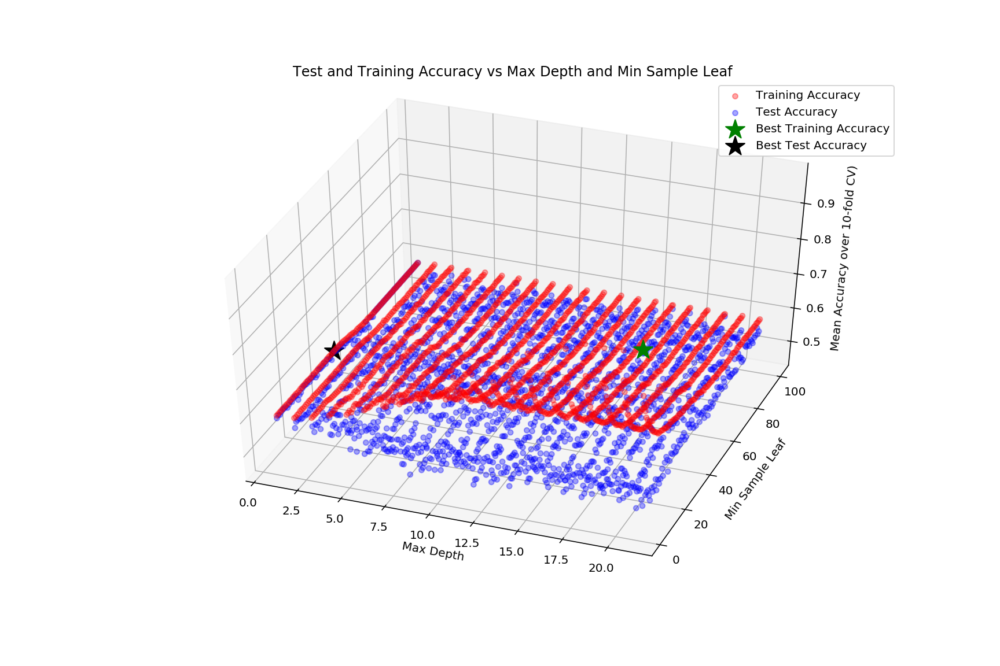

In [26]:
# Plot
# Importations (3D and interactive plot)
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
%matplotlib notebook

# Figure size
fig = plt.figure(figsize = (12, 8)) 
ax = fig.add_subplot(111, projection ='3d')


# creating axes for 3d plot 
X = [0 for i in range(0, len(max_depths) * len(min_sample_leaf))]
Y = [0 for i in range(0, len(max_depths) * len(min_sample_leaf))]
Z_train = [0 for i in range(0, len(max_depths) * len(min_sample_leaf))]
Z_test = [0 for i in range(0, len(max_depths) * len(min_sample_leaf))]

ii = 0

## assigning actual  values into 3d data set of zeros created above
for md in range(len(max_depths)):
    for ms in range(len(min_sample_leaf)):
        X[ii] = max_depths[md]
        Y[ii] = min_sample_leaf[ms]
        Z_train[ii] = mean_train_accs[ms][md] 
        Z_test[ii] = mean_test_accs[ms][md]
        ii += 1

# Title and labels
plt.title('Test and Training Accuracy vs Max Depth and Min Sample Leaf',  y = 1.08)
ax.set_xlabel("Max Depth")#, labelpad = 10)
ax.set_ylabel("Min Sample Leaf")#, labelpad = 10)
ax.set_zlabel("Mean Accuracy over 10-fold CV)")#, labelpad = 10)

# Plot
ax.scatter3D(X, Y, Z_train, c ='r', marker = 'o', 
             label = "Training Accuracy", alpha = 0.35)
ax.scatter3D(X, Y, Z_test, c ='b', marker = 'o', 
             label = "Test Accuracy", alpha = 0.35)

ax.scatter3D(global_best_train_md, global_best_train_ms, 
             best_mean_train_acc, c = 'g', marker = '*', 
             label = "Best Training Accuracy", s = 300)
ax.scatter3D(global_best_test_md, global_best_test_ms,
             best_mean_test_acc, c = 'k', marker = '*', 
             label = "Best Test Accuracy", s = 300)

plt.legend();



<IPython.core.display.Javascript object>


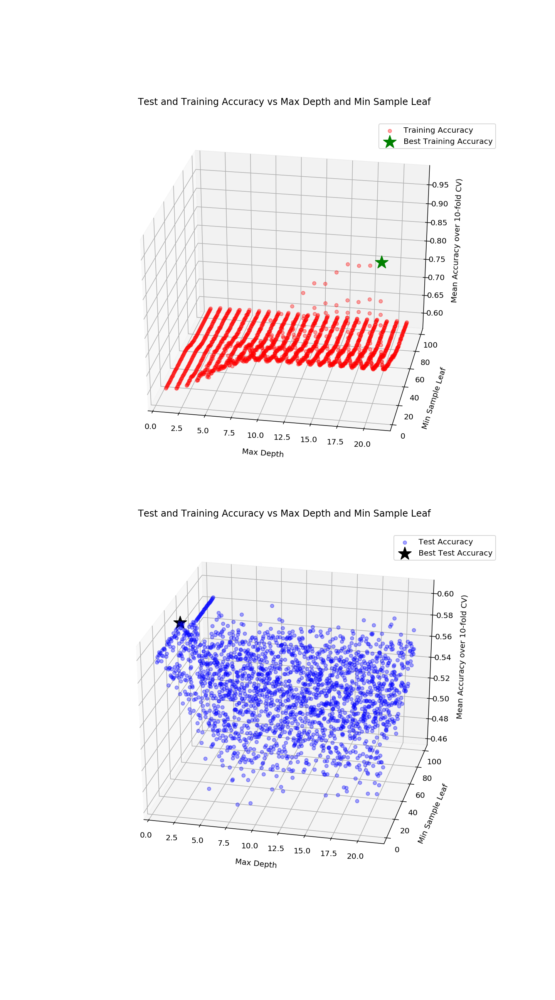

In [27]:
# Figure size
fig = plt.figure(figsize = (10, 18)) 
ax = fig.add_subplot(211, projection ='3d')
# Title and labels
plt.title('Test and Training Accuracy vs Max Depth and Min Sample Leaf',  y = 1.12)
ax.set_xlabel("Max Depth", labelpad = 10)
ax.set_ylabel("Min Sample Leaf", labelpad = 10)
ax.set_zlabel("Mean Accuracy over 10-fold CV)", labelpad = 10)

# Plot
ax.scatter3D(X, Y, Z_train, c ='r', marker = 'o', 
             label = "Training Accuracy", alpha = 0.35)

ax.scatter3D(global_best_train_md, global_best_train_ms, 
             best_mean_train_acc, c = 'g', marker = '*', 
             label = "Best Training Accuracy", s = 300)

plt.legend();
ax1 = fig.add_subplot(212, projection ='3d')
# Title and labels
plt.title('Test and Training Accuracy vs Max Depth and Min Sample Leaf',  y = 1.12)
ax1.set_xlabel("Max Depth", labelpad = 10)
ax1.set_ylabel("Min Sample Leaf", labelpad = 10)
ax1.set_zlabel("Mean Accuracy over 10-fold CV)", labelpad = 10)

# Plot

ax1.scatter3D(X, Y, Z_test, c ='b', marker = 'o', 
             label = "Test Accuracy", alpha = 0.35)

ax1.scatter3D(global_best_test_md, global_best_test_ms,
             best_mean_test_acc, c = 'k', marker = '*', 
             label = "Best Test Accuracy", s = 300)

plt.legend();

In [63]:
## test results on best model
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

model_DT_1 = tree.DecisionTreeClassifier(max_depth=2, min_samples_leaf = 40)
model_DT_1.fit(X_train, Y_train)

# Feature importance
feature_importance = model_DT_1.feature_importances_
print(feature_importance )
features = X.columns

## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(model_DT_1.predict(X_test))
y_hat_train = np.round(model_DT_1.predict(X_train))

## predicting score
print("Score for training data:",model_DT_1.score(X = X_train, y = Y_train))
print("Score for test data:",model_DT_1.score(X = X_test, y = Y_test))


[0.30860418 0.69139582 0.         0.         0.         0.
 0.        ]
Score for training data: 0.7978910369068541
Score for test data: 0.7622377622377622


### Discussion:
#### First, show how max_depth affects train and test accuracy. On a single axis, plot train and test accuracy as a function of max_depth. Use a red line to show test accuracy and a blue line to show train accuracy. Do not use your held-out test data.
Running a 10 fold cross validation to tune the max_depth parameter, we obtain the following summary results which we can visualise in the plot above:
##### Global Results for Cross Validation
- Best Max Depth (training): 21
- Best Accuracy (training): 0.9576248020224172
- Best Max Depth (testing): 2
- Best Accuracy (testing): 0.5853070175438597

We notice that for the training result, the best tree is the one with the largest depth of 21 for the training data. this makes sense because the more depth, the more complex the model. This may lead to overfitting.

For the test data, the best max_depth is 2 with average accuracy = 0.5853070175438597.

##### Test data results
The test accuracy on the left out test data is 78.32%

#### Second, show how test accuracy relates to both max_depth and min_samples_leaf. Specifically, create a 3-D plot where the x-axis is max_depth, the y-axis is min_samples_leaf, and the z-axis shows accuracy. What combination of max_depth and min-samples_leaf achieves the highest accuracy? 

Running a 10 fold cross validation to tune the max_depth parameter and min-samples_leaf, we obtain the following summary results which we can visualise in the plots above:

##### Global  Results
- Best Max Depth (training data): 21
- Best Min Sample Leaf (training data): 1
- Best Accuracy (training data): 0.979172192513369
- Best Max Depth (test data): 1
- Best Min Sample Leaf (test data): 20
- Best Accuracy (test data): 0.6081881533101046

##### Test data results
The test accuracy on the left out test data is 76.22%


#### How sensitive are the results to these two parameters?
For the training data data as expected, we note that the accuracy will increase with increase in max_depth and decrease in min-samples_leaf because that increases the model complexity. Best  tree is the one with the largest depth of 21  and smallest min-samples_leaf = 1 for the training data. The best mean Accuracy obtained was 97.20%.

For the test data, the best  tree is the one with the max_depth = 1  and  min-samples_leaf = 20. The best mean Accuracy obtained was 60.23%. From these results, we note that the accuracy is no much improved by the second parameter which is the min-samples_leaf because the accuracy decreases slighty from 78% to 76 % when we crossvalidate with the 2 parameters as opposed to when we cross validate with only mad_depth. Also despite the fact that the best max_depth drops from 1 to 2 in the second cross validation, we note that this change is not too big. As such, the model is  sensitive to max_depth parameter but not very sensitive to the min-samples_leaf parameter.

### 2.4 Support Vector Machines, for comparison

Now use an [SVM](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html) to predict survival, using  the default value for the constant penalization (C=1).  Report your accuracy on the test and train sets. 

Use cross-validation to determine a possibly better choice for C. Note that regularization is inversely proportional to the value of C in sklearn, i.e. the higher value you choose for C the less you regularize. 
    
    
* How does the test performance with SVM for your best choice of C compare to the decision tree performance?


In [28]:
from sklearn import svm
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# Create a model
SVM_clf = svm.SVC(kernel='linear', C=1) 

# Train model
SVM_clf.fit(X_train, Y_train)
# Get coeffieicent and intercept
print(SVM_clf.coef_)
print(SVM_clf.intercept_)
# Predict response 
y_pred = SVM_clf.predict(X_test)
print("Accuracy of SVM on test set is {}".format(sum(y_pred==Y_test)/len(Y_test)))


[[-5.28302572e-05  2.00026745e+00 -5.53272211e-04 -2.53894505e-04
  -7.26256000e-05 -1.14758144e-03  8.71758449e-03]]
[-0.99976793]
Accuracy of SVM on test set is 0.7902097902097902


In [30]:
# 10-fold Cross-validation for max_depth hyperparameter
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


# # Intercept and feature coefficients
# Results = [0 for i in range(0, k)]

## 
C_list = np.arange(1, 200, 20) 
# storing relevant information
train_accuracy = [[0 for i in range(k)] for j in range(len(C_list))]
test_accuracy = [[0 for i in range(k)] for j in range(len(C_list))] 
mean_train_accs = [0 for j in range(len(C_list))]
mean_test_accs = [0 for j in range(len(C_list))]

best_test_acc = 0
best_train_acc = 0
best_C_train = 0
best_C_test = 0
best_mean_test_acc = 0
best_mean_train_acc = 0

best_intercept = 0
best_coef = []

best_iter = 0
best_niter_train= 0
best_niter_test= 0

# Niters
niters = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)
# Generate the sets
for c in C_list:
    iiters = 0
    best_test_acc = 0
    best_train_acc = 0
    # Iteration number
    print("------------------------- C parameter: ", c, "-------------------------")
    for train_index, test_index in kf.split(X):
        
    
#         print("d: ",d)
#         print(niters,iiters)
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Calling the function
        # Create a model
        SVM_clf = svm.SVC(kernel='linear', C=c) 

        # Train model
        SVM_clf.fit(X_train, y_train)

        # Computing Accuracy for test and train set
        # Training Accuracy value
        train_accuracy[niters][iiters] = SVM_clf.score(X = X_train, y = y_train) 

        # Testing Accuracy value
        test_accuracy[niters][iiters] = SVM_clf.score(X = X_test, y = y_test) 

        # Best RMSE
        if test_accuracy[niters][iiters] > best_test_acc:
            best_test_acc = test_accuracy[niters][iiters]
#             best_max_depth = d
            best_iter = iiters
            best_intercept = SVM_clf.intercept_
            best_coef = SVM_clf.coef_
            #best_feature_importance  = SVM_clf.feature_importances_

        #print(niters,iiters)
        print("CV Iteration Results")
        print("-------------------- Accuracy --------------------")
        print("Training set:", train_accuracy[niters][iiters])
        print("Test set:", test_accuracy[niters][iiters])
        print("--------------------------------------------------")
        ## Next inner iteration
        iiters +=1

    ## Storing mean test and training accuracy values from cv
    mean_test_accs[niters] =  np.mean(test_accuracy[niters])
    mean_train_accs[niters] =  np.mean(train_accuracy[niters])
    print("\n\nSummary 10-fold Cross-validation for max depth", d)
    print("---------------------------------------")
    print("Average Accuracy training:",mean_train_accs[niters])
    print("Average Accuracy testing:", mean_test_accs[niters])
    print("Best Accuracy (test):", best_test_acc, "on iteration", 
          best_iter + 1)
    print("Best intercept :\n", 
          best_intercept, "and Best coefficients (test) : \n", 
         best_coef)
    print("---------------------------------------\n\n")
    
    # Best AVG accuracy (train & test)
    if mean_train_accs[niters] > best_mean_train_acc:
        best_mean_train_acc = mean_train_accs[niters]
        best_niter_train=  niters
        #best_C_train = d
    
    if mean_test_accs[niters] > best_mean_test_acc:
        best_mean_test_acc = mean_test_accs[niters]
        best_niter_test= niters
        #best_C_test = d
        
    # Next outer iteration
    niters += 1
# Summary results
print("\n\n Global Results")
print("---------------------------------------")
print("Best C (training):", C_list[best_niter_train])
print("Best Accuracy (training):", best_mean_train_acc)
print("Best C (testing):", C_list[best_niter_test])
print("Best Accuracy (testing):", best_mean_test_acc)
print("Best intercept :\n", best_intercept, 
      "and Best coefficients (test) : \n", 
         best_coef)
print("---------------------------------------\n\n")
print("---------------------------------------")

------------------------- C parameter:  1 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.60546875
Test set: 0.47368421052631576
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.58203125
Test set: 0.6842105263157895
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603515625
Test set: 0.49122807017543857
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.59765625
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.59375
Test set: 0.5789473684210527
--------------------------------------------------
CV Iteration Results
-------------------- Accura

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6015625
Test set: 0.5087719298245614
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.583984375
Test set: 0.6666666666666666
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5925925925925926
Test set: 0.5892857142857143
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5922670717592593
Average Accuracy testing: 0.5922619047619048
Best Accuracy (test): 0.6666666666666666 on iteration 4
Best intercept :
 [-1.00007106] and Best coefficients (test) : 
 [[ 1.01423513e-04 -2.79164233e-05  2.24203341e-05  8.02148525e-05
  -9.16986196e-05 -1.48570577e-04 -2.43643393e-04]]
---------------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.58984375
Test set: 0.6140350877192983
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5859375
Test set: 0.6491228070175439
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.59765625
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.595703125
Test set: 0.5614035087719298
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.58984375
Test set: 0.6140350877192983
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.591796875
Test set: 0.596491

In [64]:
### Running best model on test data
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)
## test results on best model
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# Create a model
SVM_clf = svm.SVC(kernel='linear', C=121) 

# Train model
SVM_clf.fit(X_train, Y_train)
# Get coeffieicent and intercept
print(SVM_clf.coef_)
print(SVM_clf.intercept_)
# Predict response 
y_pred = SVM_clf.predict(X_test)
print("Accuracy of SVM on test set is {}".format(sum(y_pred==Y_test)/len(Y_test)))


[[-5.57178399e-04  2.00016524e+00 -1.12745988e-03 -6.61228747e-04
   2.49377411e-04 -3.37949536e-03  1.13208935e-02]]
[-0.9977809]
Accuracy of SVM on test set is 0.7902097902097902


### Discussion:
#### Use cross-validation to determine a possibly better choice for C. Note that regularization is inversely proportional to the value of C in sklearn, i.e. the higher value you choose for C the less you regularize. 

Based on the SVM analysis, we obtain the following features from 10 fold cross validation for the regularization parameter, C:
Summary 10-fold Cross-validation 

Global Results
- Best C (training): 121
- Best Accuracy (training): 0.5922697368421053
- Best C (testing): 121
- Best Accuracy (testing): 0.5924812030075188

- Best intercept : -1.00002595

- Best coefficients:[1.71591164e-04 , 3.44583121e-04 ,-3.26614281e-05 , 5.18593624e-05,-3.46482984e-04 ,-5.13347753e-04  , 1.03944301e-03]

##### Test data results
The test accuracy on the left out test data is 79.02%



#### How does the test performance with SVM for your best choice of C compare to the decision tree performance?
The performance is similar to that of the decision tree. We note that the accuracy after cross validation is about 79.02% which is very close though slightly better than the test accuracy of about  78% obtained from the decision tree. 


### 2.5 Missing Data
Have you been paying close attention to your features? If not, now is a good time to start. Perform analysis that allows you to answer the following questions:
* Do any of your features have missing data? If so, which ones? What percent of observations have missing data?
* What happens to observations with missing data when you run the decision tree and SVM models above?
* Use one of the methods we discussed in class to impute missing values
* Rerun your decision tree and SVM on the new dataset with imputed missing values. What do you notice?

In [31]:
# Enter your code here
full_data = X_data
print(" Data with relevant features")
display(full_data.describe())
print(" Data with all numerical features")
display(data_train.describe())


 Data with relevant features


,Survived,Pclass,Sex,SibSp,Parch,Embarked,Age_std,Fare_std
count,891.000000,891.000000,891.000000,891.000000,891.000000,889.000000,714.000000,891.000000
mean,0.383838,2.308642,0.352413,0.523008,0.381594,0.362205,0.371239,0.062858
std,0.486592,0.836071,0.477990,1.102743,0.806057,0.636157,0.181581,0.096995
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.005250,0.000000
25%,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.251563,0.015440
50%,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.350000,0.028213
75%,1.000000,3.000000,1.000000,1.000000,0.000000,1.000000,0.475000,0.060508
max,1.000000,3.000000,1.000000,8.000000,6.000000,2.000000,1.000000,1.000000


 Data with all numerical features


,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
count,891.000000,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000,889.000000
mean,446.000000,0.383838,2.308642,0.352413,29.699118,0.523008,0.381594,32.204208,0.362205
std,257.353842,0.486592,0.836071,0.477990,14.526497,1.102743,0.806057,49.693429,0.636157
min,1.000000,0.000000,1.000000,0.000000,0.420000,0.000000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,0.000000,20.125000,0.000000,0.000000,7.910400,0.000000
50%,446.000000,0.000000,3.000000,0.000000,28.000000,0.000000,0.000000,14.454200,0.000000
75%,668.500000,1.000000,3.000000,1.000000,38.000000,1.000000,0.000000,31.000000,1.000000
max,891.000000,1.000000,3.000000,1.000000,80.000000,8.000000,6.000000,512.329200,2.000000


In [32]:
## coumpute percentage of missing age data
age_missing = 891-714
print(age_missing)
per_age_miss = 100*age_missing/891
print(per_age_miss)


177
19.865319865319865


In [41]:
print(data_train.dtypes)

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex              int64
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked       float64
dtype: object


In [33]:
print(" Data with all non-numeric features")
display(data_train[['Name','Ticket', 'Cabin']].describe())

 Data with all non-numeric features


,Name,Ticket,Cabin
count,891,891,204
unique,891,681,147
top,"Graham, Mrs. William Thompson (Edith Junkins)",347082,G6
freq,1,7,4


### Testing Decision Tree and SVM with data that contains NANs without modifications.

In [46]:
## Running decision tree with missing data

## Data
Y = X_data["Survived"]
X = X_data.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# Fit on decision tree 
#with  criterion='entropy', max_depth (for prunning) criterion='entropy',max_depth = 4
model_DT = tree.DecisionTreeClassifier()
model_DT.fit(X_train, Y_train)

# Feature importance and number of leaves and depth
print("")
print("Feature names:", X_train.columns)
print("Features importance:\n", model_DT.feature_importances_)
print("Model number of leaves: ", model_DT.get_n_leaves())
print("Model depth: ",model_DT.get_depth())


## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(model_DT.predict(X_test))
y_hat_train = np.round(model_DT.predict(X_train))

## predicting score
print("Score for training data:",model_DT.score(X = X_train, y = Y_train))
print("Score for test data:",model_DT.score(X = X_test, y = Y_test))

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

In [35]:
## Running SVM with missing data

## Data
Y = X_data["Survived"]
X = X_data.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# Create a model
SVM_clf = svm.SVC(kernel='linear', C=121) 

# Train model
SVM_clf.fit(X_train, Y_train)
# Get coeffieicent nad intercept
print(SVM_clf.coef_)
print(SVM_clf.intercept_)
# Predict response 
y_pred = SVM_clf.predict(X_test)
print("Accuracy of SVM on test set is {}".format(sum(y_pred==Y_test)/len(Y_test)))


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

### Decision tree : Running decision tree with missing age  data replaced by mean

In [170]:
## Running decision tree with missing data
## Replace missing values by mean age
data = X_data.copy()
temp =np.round(np.mean(X_data_['Age_std']),4)
data['Age_std'] = data['Age_std'].fillna(temp)
## Find remaining missing values
print(np.sum(np.isnan(data)))
## drop to na values in embarked
data = data.dropna()
print("Updated data shape:",data.shape)

## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# Fit on decision tree 
#with  criterion='entropy', max_depth (for prunning) criterion='entropy',max_depth = 4
model_DT = tree.DecisionTreeClassifier()
model_DT.fit(X_train, Y_train)

# Feature importance and number of leaves and depth
print("")
print("Feature names:", X_train.columns)
print("Features importance:\n", model_DT.feature_importances_)
print("Model number of leaves: ", model_DT.get_n_leaves())
print("Model depth: ",model_DT.get_depth())

## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(model_DT.predict(X_test))
y_hat_train = np.round(model_DT.predict(X_train))

## predicting score
print("Score for training data:",model_DT.score(X = X_train, y = Y_train))
print("Score for test data:",model_DT.score(X = X_test, y = Y_test))

Survived    0
Pclass      0
Sex         0
SibSp       0
Parch       0
Embarked    2
Age_std     0
Fare_std    0
dtype: int64
Updated data shape: (889, 8)

Feature names: Index(['Pclass', 'Sex', 'SibSp', 'Parch', 'Embarked', 'Age_std', 'Fare_std'], dtype='object')
Features importance:
 [0.10238235 0.34401862 0.04518333 0.03719489 0.02346091 0.24518917
 0.20257074]
Model number of leaves:  155
Model depth:  18
Score for training data: 0.9845288326300985
Score for test data: 0.7584269662921348


In [48]:
## Running decision tree with missing data
# 10-fold Cross-validation for max_depth hyperparameter d
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


# # Intercept and feature coefficients
# Results = [0 for i in range(0, k)]

## 
max_depths = [i for i in range(1,22)]
# storing relevant information
train_accuracy = [[0 for i in range(k)] for j in range(len(max_depths))]
test_accuracy = [[0 for i in range(k)] for j in range(len(max_depths))] 
mean_train_accs = [0 for j in range(len(max_depths))]
mean_test_accs = [0 for j in range(len(max_depths))]

best_test_acc = 0
best_train_acc = 0
best_max_depth_train = 0
best_max_depth_test = 0
best_mean_test_acc = 0
best_mean_train_acc = 0

best_feature_importance = []

best_iter = 0
best_niter_train= 0
best_niter_test= 0

# Niters
niters = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)
# Generate the sets
for d in max_depths:
    iiters = 0
    best_test_acc = 0
    best_train_acc = 0
    # Iteration number
    print("------------------------- Max depth", d, "-------------------------")
    for train_index, test_index in kf.split(X):
        
    
#         print("d: ",d)
#         print(niters,iiters)
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Calling the function
        DT_clf = tree.DecisionTreeClassifier(max_depth=d,random_state = 100)
        DT_clf = DT_clf.fit(X_train, y_train)

        # Computing Accuracy for test and train set
        # Training Accuracy value
        train_accuracy[niters][iiters] = DT_clf.score(X = X_train, y = y_train) 

        # Testing Accuracy value
        test_accuracy[niters][iiters] = DT_clf.score(X = X_test, y = y_test) 

        # Best RMSE
        if test_accuracy[niters][iiters] > best_test_acc:
            best_test_acc = test_accuracy[niters][iiters]
            best_max_depth = d
            best_iter = iiters
            best_feature_importance  = DT_clf.feature_importances_

        #print(niters,iiters)
        print("CV Iteration Results")
        print("-------------------- Accuracy --------------------")
        print("Training set:", train_accuracy[niters][iiters])
        print("Test set:", test_accuracy[niters][iiters])
        print("--------------------------------------------------")
        ## Next inner iteration
        iiters +=1

    ## Storing mean test and training accuracy values from cv
    mean_test_accs[niters] =  np.mean(test_accuracy[niters])
    mean_train_accs[niters] =  np.mean(train_accuracy[niters])
    print("\n\nSummary 10-fold Cross-validation for max depth", d)
    print("---------------------------------------")
    print("Average Accuracy training:",mean_train_accs[niters])
    print("Average Accuracy testing:", mean_test_accs[niters])
    print("Best Accuracy (test):", best_test_acc, "on iteration", 
          best_iter + 1)
    print("Importance of features best accuracy (test):\n", 
          best_feature_importance)
    print("---------------------------------------\n\n")
    
    # Best AVG accuracy (train & test)
    if mean_train_accs[niters] > best_mean_train_acc:
        best_mean_train_acc = mean_train_accs[niters]
        best_niter_train=  niters
        best_max_depth_train = d
    
    if mean_test_accs[niters] > best_mean_test_acc:
        best_mean_test_acc = mean_test_accs[niters]
        best_niter_test= niters
        best_max_depth_test = d
        
    # Next outer iteration
    niters += 1
# Summary results
print("\n\n Global Results")
print("---------------------------------------")
print("Best Max Depth (training):", max_depths[best_niter_train])
print("Best Accuracy (training):", best_mean_train_acc)
print("Best Max Depth (testing):", max_depths[best_niter_test])
print("Best Accuracy (testing):", best_mean_test_acc)
print("---------------------------------------")

------------------------- Max depth 1 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.594679186228482
Test set: 0.5972222222222222
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596875
Test set: 0.5774647887323944
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.590625
Test set: 0.6338028169014085
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.590625
Test set: 0.6338028169014085
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603125
Test set: 0.5211267605633803
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy -

Training set: 0.628125
Test set: 0.5915492957746479
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.63125
Test set: 0.6056338028169014
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6390625
Test set: 0.5774647887323944
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6375
Test set: 0.6056338028169014
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 5
---------------------------------------
Average Accuracy training: 0.6410377543035993
Average Accuracy testing: 0.5668818466353677
Best Accuracy (test): 0.6197183098591549 on iteration 6
Importance of features best accuracy (test):
 [0.10459279 0.         0.         0.         0.17388618 0.13917556
 0.58234547]
----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.74375
Test set: 0.5633802816901409
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.709375
Test set: 0.5774647887323944
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.759375
Test set: 0.49295774647887325
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75625
Test set: 0.4084507042253521
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7578125
Test set: 0.49295774647887325
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7671875
Test set: 0.5492957746478874

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8265625
Test set: 0.4647887323943662
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.734375
Test set: 0.5211267605633803
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8140625
Test set: 0.5633802816901409
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 13
---------------------------------------
Average Accuracy training: 0.8288827758215962
Average Accuracy testing: 0.5414514866979656
Best Accuracy (test): 0.5915492957746479 on iteration 7
Importance of features best accuracy (test):
 [0.02960265 0.07735918 0.05619277 0.04725053 0.07397632 0.32616541
 0.38945315]
---------------------------------------


------------------------- Max depth 14 -------------------------
C

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9296875
Test set: 0.5352112676056338
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.934375
Test set: 0.5352112676056338
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9078125
Test set: 0.5211267605633803
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9
Test set: 0.43661971830985913
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9453125
Test set: 0.39436619718309857
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 18
---------------------------------------
Average Accuracy training: 0.9099

In [66]:
## test results on best model
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

model_DT_1 = tree.DecisionTreeClassifier(max_depth=1)
model_DT_1.fit(X_train, Y_train)

# Feature importance
feature_importance = model_DT_1.feature_importances_
print(feature_importance )
features = X.columns

## Predictions & Accuracy: 
# Testing and training predictions
y_hat_test = np.round(model_DT_1.predict(X_test))
y_hat_train = np.round(model_DT_1.predict(X_train))

## predicting score
print("Score for training data:",model_DT_1.score(X = X_train, y = Y_train))
print("Score for test data:",model_DT_1.score(X = X_test, y = Y_test))


[0. 1. 0. 0. 0. 0. 0.]
Score for training data: 0.8030942334739803
Score for test data: 0.7191011235955056


### SVM : Running decision tree with missing age  data replaced by mean

In [44]:
## Runninung SVM with missing data
## Replace missing values by mean age
data = X_data.copy()
temp =np.round(np.mean(X_data_['Age_std']),4)
data['Age_std'] = data['Age_std'].fillna(temp)
## Find remaining missing values
print(np.sum(np.isnan(data)))
## drop to na values in embarked
data = data.dropna()
print("Updated data shape:",data.shape)

## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# # Create a model
SVM_clf = svm.SVC(kernel='linear', C=121) 

# Train model
SVM_clf.fit(X_train, Y_train)
# Get coeffieicent nad intercept
print(SVM_clf.coef_)
print(SVM_clf.intercept_)
# Predict response 
y_pred = SVM_clf.predict(X_test)
print("Accuracy of SVM on test set is {}".format(sum(y_pred==Y_test)/len(Y_test)))

Survived    0
Pclass      0
Sex         0
SibSp       0
Parch       0
Embarked    2
Age_std     0
Fare_std    0
dtype: int64
Updated data shape: (889, 8)
[[-0.15761112  2.12464707 -0.24651097 -0.10232776  0.08531388 -0.97271443
   1.86255884]]
[-0.36481067]
Accuracy of SVM on test set is 0.7191011235955056


In [45]:
# 10-fold Cross-validation for max_depth hyperparameter
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


# # Intercept and feature coefficients
# Results = [0 for i in range(0, k)]

## 
C_list = np.arange(1, 200, 20) 
# storing relevant information
train_accuracy = [[0 for i in range(k)] for j in range(len(C_list))]
test_accuracy = [[0 for i in range(k)] for j in range(len(C_list))] 
mean_train_accs = [0 for j in range(len(C_list))]
mean_test_accs = [0 for j in range(len(C_list))]

best_test_acc = 0
best_train_acc = 0
best_C_train = 0
best_C_test = 0
best_mean_test_acc = 0
best_mean_train_acc = 0

best_intercept = 0
best_coef = []

best_iter = 0
best_niter_train= 0
best_niter_test= 0

# Niters
niters = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)
# Generate the sets
for c in C_list:
    iiters = 0
    best_test_acc = 0
    best_train_acc = 0
    # Iteration number
    print("------------------------- C parameter: ", c, "-------------------------")
    for train_index, test_index in kf.split(X):
        
    
#         print("d: ",d)
#         print(niters,iiters)
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Calling the function
        # Create a model
        SVM_clf = svm.SVC(kernel='linear', C=c) 

        # Train model
        SVM_clf.fit(X_train, y_train)

        # Computing Accuracy for test and train set
        # Training Accuracy value
        train_accuracy[niters][iiters] = SVM_clf.score(X = X_train, y = y_train) 

        # Testing Accuracy value
        test_accuracy[niters][iiters] = SVM_clf.score(X = X_test, y = y_test) 

        # Best RMSE
        if test_accuracy[niters][iiters] > best_test_acc:
            best_test_acc = test_accuracy[niters][iiters]
#             best_max_depth = d
            best_iter = iiters
            best_intercept = SVM_clf.intercept_
            best_coef = SVM_clf.coef_
            #best_feature_importance  = SVM_clf.feature_importances_

        #print(niters,iiters)
        print("CV Iteration Results")
        print("-------------------- Accuracy --------------------")
        print("Training set:", train_accuracy[niters][iiters])
        print("Test set:", test_accuracy[niters][iiters])
        print("--------------------------------------------------")
        ## Next inner iteration
        iiters +=1

    ## Storing mean test and training accuracy values from cv
    mean_test_accs[niters] =  np.mean(test_accuracy[niters])
    mean_train_accs[niters] =  np.mean(train_accuracy[niters])
    print("\n\nSummary 10-fold Cross-validation for max depth", d)
    print("---------------------------------------")
    print("Average Accuracy training:",mean_train_accs[niters])
    print("Average Accuracy testing:", mean_test_accs[niters])
    print("Best Accuracy (test):", best_test_acc, "on iteration", 
          best_iter + 1)
    print("Best intercept :\n", 
          best_intercept, "and Best coefficients (test) : \n", 
         best_coef)
    print("---------------------------------------\n\n")
    
    # Best AVG accuracy (train & test)
    if mean_train_accs[niters] > best_mean_train_acc:
        best_mean_train_acc = mean_train_accs[niters]
        best_niter_train=  niters
        #best_C_train = d
    
    if mean_test_accs[niters] > best_mean_test_acc:
        best_mean_test_acc = mean_test_accs[niters]
        best_niter_test= niters
        #best_C_test = d
        
    # Next outer iteration
    niters += 1
# Summary results
print("\n\n Global Results")
print("---------------------------------------")
print("Best C (training):", C_list[best_niter_train])
print("Best Accuracy (training):", best_mean_train_acc)
print("Best C (testing):", C_list[best_niter_test])
print("Best Accuracy (testing):", best_mean_test_acc)
print("Best intercept :\n", best_intercept, 
      "and Best coefficients (test) : \n", 
         best_coef)
print("---------------------------------------\n\n")
print("---------------------------------------")

------------------------- C parameter:  1 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.594679186228482
Test set: 0.5972222222222222
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596875
Test set: 0.5774647887323944
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.590625
Test set: 0.6338028169014085
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.590625
Test set: 0.6338028169014085
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603125
Test set: 0.5211267605633803
--------------------------------------------------
CV Iteration Results
-------------------- Accura

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5875
Test set: 0.6619718309859155
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921875
Test set: 0.6197183098591549
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 21
---------------------------------------
Average Accuracy training: 0.5949364241001565
Average Accuracy testing: 0.5949139280125195
Best Accuracy (test): 0.6619718309859155 on iteration 9
Best intercept :
 [-0.99999133] and Best coefficients (test) : 
 [[ 9.25753993e-05 -3.34589131e-05 -6.27164627e-06  1.14496421e-04
   3.81398249e-05 -4.63269796e-04 -2.55949558e-04]]
---------------------------------------


------------------------- C parameter:  81 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596244131455399
Test set: 0.58

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596875
Test set: 0.5774647887323944
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5984375
Test set: 0.5633802816901409
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6015625
Test set: 0.5352112676056338
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5984375
Test set: 0.5633802816901409
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603125
Test set: 0.5211267605633803
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5828125
Test set: 0.70422535211267

In [65]:
### Running best model on test data
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)
## test results on best model
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# Create a model
SVM_clf = svm.SVC(kernel='linear', C=161) 

# Train model
SVM_clf.fit(X_train, Y_train)
# Get coeffieicent and intercept
print(SVM_clf.coef_)
print(SVM_clf.intercept_)
# Predict response 
y_pred = SVM_clf.predict(X_test)
print("Accuracy of SVM on test set is {}".format(sum(y_pred==Y_test)/len(Y_test)))


[[-0.15710805  2.12605403 -0.2465063  -0.10208859  0.08599837 -0.97195438
   1.86406994]]
[-0.36782305]
Accuracy of SVM on test set is 0.7191011235955056


### Observations
#### Do any of your features have missing data? If so, which ones? What percent of observations have missing data?

The age variable has missing data. We notice that there are 891-714 = 177 missing data points which accounts of  19.865 percent of the data. This is a huge fraction of the data however, I found it better to remove the data because adding the median or mean age just did not seem like a good strategy to adopt. However for the purpose of experimentation, I will also replave missing data by the mean age of the data set and run decision tree algorithms

The cabin variable is missing 891-404 = 687 data points which accounts for 77.104 percent of the data. This is a significan ammount off mising data and as such, it is not okay to just delete all the rows of data. It makes not sense to replace missing values by mean, median or modal values. In this case, I replaced missing data values by 99999 and ran the algorithm. 


#### What happens to observations with missing data when you run the decision tree and SVM models above?
When I try to run SVM and decision tree directly with the missing data as NANs, I get a value error. This is probably because the SVM classifier expects numeric values instead.

#### Use one of the methods we discussed in class to impute missing values
#### Decision Tree, cross validating on max_depth only
From the analysis above, after replacing the missing age values by the mean age and removing the 2 nan values in Embarked column, we obtain the following results:
Global Results
- Best Max Depth (training): 21
- Best Accuracy (training): 0.9351484252738654
- Best Max Depth (testing): 1
- Best Accuracy (testing): 0.594933489827856
- Importance of features best accuracy (test): [0. 1. 0. 0. 0. 0. 0.]
 
 
 #### Test data
Accuracy of decision tree on test set is 0.7191 (71.91%)
 
From these results, we see that the only important feature in our model is the $Sex$ variable is also important to our model.
#### SVM
From the analysis above, after replacing the missing age values by the mean age and removing the 2 nan values in Embarked column, we obtain the following results:
Global Results
- Best C (training): 161
- Best Accuracy (training): 0.5949391138497653
- Best C (testing): 161
- Best Accuracy (testing): 0.5951291079812207
- Best intercept :
 [-0.99862339] 
- Best coefficients (test) : 
 [[-5.31710248e-05 -2.57009920e-04 -5.88650146e-05  2.58563916e-04
   1.15263578e-04 -2.07891460e-03 -5.79390179e-04]]
   
#### Test data
Accuracy of SVM on test set is 0.7191 (71.91%)

#### Rerun your decision tree and SVM on the new dataset with imputed missing values. What do you notice?

In both models, the model performance only was worse than before in both cases with SVM dropping from 79% to 72% and Decision tree dropiing from 78% to 72%. This decreased performance may be because we replaced the missing values by mean age values which may be cause a bias in our data set. we have biased the data towards the age values that we have already recorded. Some other strategies could have been replacing the missing values by a large number 9999 and creating a separate category. This may have improved prediction more by focusing on the other relevant features.


## Part 3: Forests

### 3.1: Random Forest
Use the [random forest classifier](http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) to predict survival on the titanic. Use cross-validation on the training data to choose the best hyper-parameters. 
* What hyperparameters did you select with cross-validation?
* How does the cross-validated performance (average across validation folds) compare to the test performance (using the top-performing, fitted model selected through cross-validation)?
* How does the RF performance compare to the decision tree and SVM?
* Create a plot that shows how cross-validated performance (y-axis) relates to the number of trees in the forest (x-axis).

In [49]:
from sklearn.ensemble import RandomForestClassifier
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

k = 5
RF_clf = RandomForestClassifier(criterion='entropy',  n_estimators=10)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
RF_clf.fit(X_train, Y_train)
predict_labels = RF_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))


Test Accuracy of decision tree is 0.8111888111888111


In [51]:
# 10-fold Cross-validation for number of estimators hyperparameter
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


# # Intercept and feature coefficients
# Results = [0 for i in range(0, k)]

## 
n_estimators = np.arange(1,5000,200)
# storing relevant information
train_accuracy = [[0 for i in range(k)] for j in range(len(n_estimators))]
test_accuracy = [[0 for i in range(k)] for j in range(len(n_estimators))] 
mean_train_accs = [0 for j in range(len(n_estimators))]
mean_test_accs = [0 for j in range(len(n_estimators))]

best_test_acc = 0
best_train_acc = 0
best_n_estimators_train = 0
best_n_estimators_test = 0
best_mean_test_acc = 0
best_mean_train_acc = 0

best_feature_importance = []

best_iter = 0
best_niter_train= 0
best_niter_test= 0

# Niters
niters = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)
# Generate the sets
for d in n_estimators:
    iiters = 0
    best_test_acc = 0
    best_train_acc = 0
    # Iteration number
    print("------------------------- n_estimators", d, "-------------------------")
    for train_index, test_index in kf.split(X):
        
    
#         print("d: ",d)
#         print(niters,iiters)
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Calling the function
        
        RF_clf = RandomForestClassifier(criterion='entropy', n_estimators=d,random_state = 0)

        RF_clf.fit(X_train, y_train)

        # Computing Accuracy for test and train set
        # Training Accuracy value
        train_accuracy[niters][iiters] = RF_clf.score(X = X_train, y = y_train) 

        # Testing Accuracy value
        test_accuracy[niters][iiters] = RF_clf.score(X = X_test, y = y_test) 

        # Best RMSE
        if test_accuracy[niters][iiters] > best_test_acc:
            best_test_acc = test_accuracy[niters][iiters]
            best_iter = iiters
            best_feature_importance  = RF_clf.feature_importances_

        #print(niters,iiters)
        print("CV Iteration Results")
        print("-------------------- Accuracy --------------------")
        print("Training set:", train_accuracy[niters][iiters])
        print("Test set:", test_accuracy[niters][iiters])
        print("--------------------------------------------------")
        ## Next inner iteration
        iiters +=1

    ## Storing mean test and training accuracy values from cv
    mean_test_accs[niters] =  np.mean(test_accuracy[niters])
    mean_train_accs[niters] =  np.mean(train_accuracy[niters])
    print("\n\nSummary 10-fold Cross-validation for max depth", d)
    print("---------------------------------------")
    print("Average Accuracy training:",mean_train_accs[niters])
    print("Average Accuracy testing:", mean_test_accs[niters])
    print("Best Accuracy (test):", best_test_acc, "on iteration", 
          best_iter + 1)
    print("Importance of features best accuracy (test):\n", 
          best_feature_importance)
    print("---------------------------------------\n\n")
    
    # Best AVG accuracy (train & test)
    if mean_train_accs[niters] > best_mean_train_acc:
        best_mean_train_acc = mean_train_accs[niters]
        best_niter_train=  niters
        best_n_estimators_train = d
    
    if mean_test_accs[niters] > best_mean_test_acc:
        best_mean_test_acc = mean_test_accs[niters]
        best_niter_test= niters
        best_n_estimators_test = d
        
    # Next outer iteration
    niters += 1
# Summary results
print("\n\n Global Results")
print("---------------------------------------")
print("Best n_estimators (training):", n_estimators[best_niter_train])
print("Best Accuracy (training):", best_mean_train_acc)
print("Best n_estimators (testing):", n_estimators[best_niter_test])
print("Best Accuracy (testing):", best_mean_test_acc)
print("---------------------------------------")

------------------------- n_estimators 1 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8091106290672451
Test set: 0.4807692307692308
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8199566160520607
Test set: 0.5961538461538461
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8112798264642083
Test set: 0.6730769230769231
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8116883116883117
Test set: 0.5294117647058824
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8181818181818182
Test set: 0.5686274509803921
--------------------------------------------------
CV Itera

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9891774891774892
Test set: 0.5294117647058824
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.4117647058823529
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.5490196078431373
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 601
---------------------------------------
Average Accuracy training: 0.9876543557671541
Average Accuracy testing: 0.531975867269985
Best Accuracy (test): 0.6470588235294118 on iteration 5
Importance of features best accuracy (test):
 [0.0355546  0.0341484  0.05763398 0.053852   0.0368126  0.42792338
 0.35407503]
---------------------------------------


------------------------- n_estimators

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848156182212582
Test set: 0.5769230769230769
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.5490196078431373
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.987012987012987
Test set: 0.47058823529411764
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.987012987012987
Test set: 0.47058823529411764
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.5098039215686274
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Tra

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9891774891774892
Test set: 0.47058823529411764
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 2001
---------------------------------------
Average Accuracy training: 0.9874383750739499
Average Accuracy testing: 0.532051282051282
Best Accuracy (test): 0.6274509803921569 on iteration 6
Importance of features best accuracy (test):
 [0.03601723 0.03599234 0.05610209 0.04711324 0.03616721 0.42691441
 0.36169347]
---------------------------------------


------------------------- n_estimators 2201 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848156182212582
Test set: 0.6730769230769231
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9891540130151844
Test set: 0.5
--------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.5882352941176471
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.987012987012987
Test set: 0.5686274509803921
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9913419913419913
Test set: 0.6666666666666666
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.5294117647058824
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.987012987012987
Test set: 0.47058823529411764
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Trai

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9869848156182213
Test set: 0.5
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9869848156182213
Test set: 0.6153846153846154
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9913232104121475
Test set: 0.46153846153846156
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9891774891774892
Test set: 0.49019607843137253
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.5686274509803921
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.6274509803921569
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9848484848484849
Test set: 0.5294117647058824
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9913419913419913
Test set: 0.5098039215686274
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 4201
---------------------------------------
Average Accuracy training: 0.9872214553342535
Average Accuracy testing: 0.5418552036199096
Best Accuracy (test): 0.6538461538461539 on iteration 2
Importance of features best accuracy (test):
 [0.03390969 0.03293237 0.0570338  0.05120218 0.03552826 0.43521413
 0.35417958]
---------------------------------------


------------------------- n_estimato

<IPython.core.display.Javascript object>


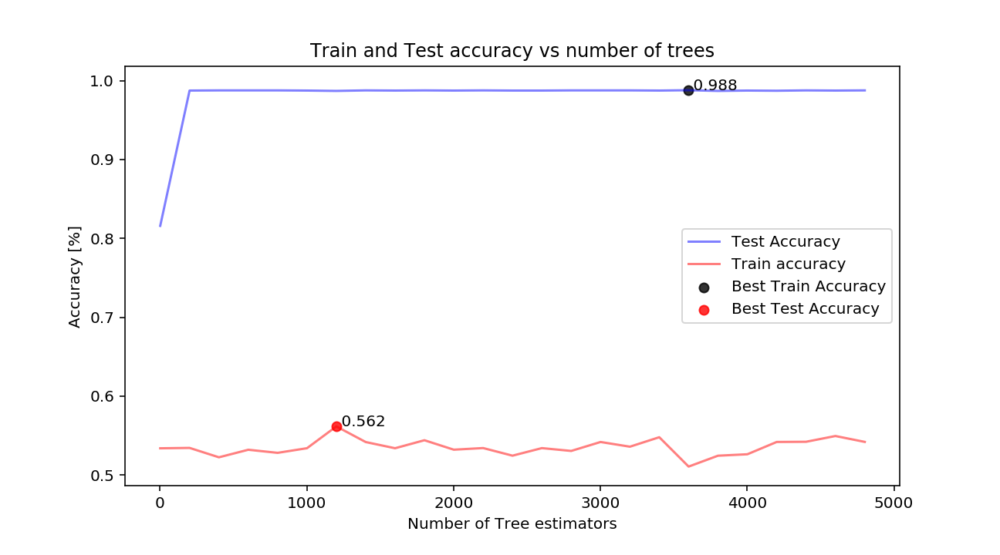

In [52]:
## plot that shows how cross-validated performance (y-axis) relates to the number of trees in the forest (x-axis).
# Figure size
plt.figure(figsize = (9, 5)) 


# axes
ax = plt.subplot(111)                    

# plots
plt.plot(n_estimators, mean_train_accs, 'b-', alpha = 0.5, label = "Test Accuracy")
plt.plot(n_estimators, mean_test_accs, 'r-', alpha = 0.5, label = "Train accuracy")

plt.scatter(n_estimators[best_niter_train], best_mean_train_acc, color = 'k', 
            alpha = 0.8, label = "Best Train Accuracy")

ax.annotate(' ' + str(np.round(best_mean_train_acc, 3)), 
            (n_estimators[best_niter_train], best_mean_train_acc))

plt.scatter(n_estimators[best_niter_test], best_mean_test_acc, 
            color = 'r', alpha = 0.8, label = "Best Test Accuracy")

ax.annotate(' ' + str(np.round(best_mean_test_acc, 3)), 
            (n_estimators[best_niter_test], best_mean_test_acc))

# Labels, Title, and legends
plt.xlabel("Number of Tree estimators")
plt.ylabel('Accuracy [%]')
plt.title("Train and Test accuracy vs number of trees")
plt.legend();

In [67]:
## Running algorithm ontuned parameter
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

RF_clf = RandomForestClassifier(criterion='entropy',  n_estimators=1201)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
RF_clf.fit(X_train, Y_train)
predict_labels = RF_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))


Test Accuracy of decision tree is 0.8181818181818182


### Random Forest with missing values

In [68]:
# 10-fold Cross-validation for number of estimators hyperparameter
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


# # Intercept and feature coefficients
# Results = [0 for i in range(0, k)]

## 
n_estimators = np.arange(1,5000,200)
# storing relevant information
train_accuracy = [[0 for i in range(k)] for j in range(len(n_estimators))]
test_accuracy = [[0 for i in range(k)] for j in range(len(n_estimators))] 
mean_train_accs = [0 for j in range(len(n_estimators))]
mean_test_accs = [0 for j in range(len(n_estimators))]

best_test_acc = 0
best_train_acc = 0
best_n_estimators_train = 0
best_n_estimators_test = 0
best_mean_test_acc = 0
best_mean_train_acc = 0

best_feature_importance = []

best_iter = 0
best_niter_train= 0
best_niter_test= 0

# Niters
niters = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)
# Generate the sets
for d in n_estimators:
    iiters = 0
    best_test_acc = 0
    best_train_acc = 0
    # Iteration number
    print("------------------------- n_estimators", d, "-------------------------")
    for train_index, test_index in kf.split(X):
        
    
#         print("d: ",d)
#         print(niters,iiters)
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Calling the function
        
        RF_clf = RandomForestClassifier(criterion='entropy', n_estimators=d,random_state = 0)

        RF_clf.fit(X_train, y_train)

        # Computing Accuracy for test and train set
        # Training Accuracy value
        train_accuracy[niters][iiters] = RF_clf.score(X = X_train, y = y_train) 

        # Testing Accuracy value
        test_accuracy[niters][iiters] = RF_clf.score(X = X_test, y = y_test) 

        # Best RMSE
        if test_accuracy[niters][iiters] > best_test_acc:
            best_test_acc = test_accuracy[niters][iiters]
            best_iter = iiters
            best_feature_importance  = RF_clf.feature_importances_

        #print(niters,iiters)
        print("CV Iteration Results")
        print("-------------------- Accuracy --------------------")
        print("Training set:", train_accuracy[niters][iiters])
        print("Test set:", test_accuracy[niters][iiters])
        print("--------------------------------------------------")
        ## Next inner iteration
        iiters +=1

    ## Storing mean test and training accuracy values from cv
    mean_test_accs[niters] =  np.mean(test_accuracy[niters])
    mean_train_accs[niters] =  np.mean(train_accuracy[niters])
    print("\n\nSummary 10-fold Cross-validation for max depth", d)
    print("---------------------------------------")
    print("Average Accuracy training:",mean_train_accs[niters])
    print("Average Accuracy testing:", mean_test_accs[niters])
    print("Best Accuracy (test):", best_test_acc, "on iteration", 
          best_iter + 1)
    print("Importance of features best accuracy (test):\n", 
          best_feature_importance)
    print("---------------------------------------\n\n")
    
    # Best AVG accuracy (train & test)
    if mean_train_accs[niters] > best_mean_train_acc:
        best_mean_train_acc = mean_train_accs[niters]
        best_niter_train=  niters
        best_n_estimators_train = d
    
    if mean_test_accs[niters] > best_mean_test_acc:
        best_mean_test_acc = mean_test_accs[niters]
        best_niter_test= niters
        best_n_estimators_test = d
        
    # Next outer iteration
    niters += 1
# Summary results
print("\n\n Global Results")
print("---------------------------------------")
print("Best n_estimators (training):", n_estimators[best_niter_train])
print("Best Accuracy (training):", best_mean_train_acc)
print("Best n_estimators (testing):", n_estimators[best_niter_test])
print("Best Accuracy (testing):", best_mean_test_acc)
print("---------------------------------------")

------------------------- n_estimators 1 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.796875
Test set: 0.5263157894736842
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.779296875
Test set: 0.42105263157894735
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.78125
Test set: 0.40350877192982454
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.78125
Test set: 0.45614035087719296
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.787109375
Test set: 0.40350877192982454
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.97265625
Test set: 0.5263157894736842
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9785575048732943
Test set: 0.35714285714285715
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 601
---------------------------------------
Average Accuracy training: 0.9761760629873294
Average Accuracy testing: 0.4708020050125312
Best Accuracy (test): 0.5964912280701754 on iteration 4
Importance of features best accuracy (test):
 [0.03409488 0.03333438 0.05259141 0.0510253  0.0337361  0.4382032
 0.35701473]
---------------------------------------


------------------------- n_estimators 801 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.974609375
Test set: 0.43859649122807015
---------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.98046875
Test set: 0.43859649122807015
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.98046875
Test set: 0.5263157894736842
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.974609375
Test set: 0.42105263157894735
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.974609375
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.974609375
Test set: 0.5964912280701754
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9707602339181286
Test s

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9765625
Test set: 0.43859649122807015
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.97265625
Test set: 0.49122807017543857
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.970703125
Test set: 0.5789473684210527
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.978515625
Test set: 0.43859649122807015
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.978515625
Test set: 0.45614035087719296
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.978515625
Test set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.974609375
Test set: 0.49122807017543857
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9805068226120858
Test set: 0.4642857142857143
--------------------------------------------------


Summary 10-fold Cross-validation for max depth 2801
---------------------------------------
Average Accuracy training: 0.9761756822612085
Average Accuracy testing: 0.48853383458646615
Best Accuracy (test): 0.5964912280701754 on iteration 6
Importance of features best accuracy (test):
 [0.03361615 0.03312144 0.05563986 0.04870952 0.03526897 0.44207068
 0.35157338]
---------------------------------------


------------------------- n_estimators 3001 -------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.97265625
Test set: 0.5087719298245614
------------------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9765625
Test set: 0.5263157894736842
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.98046875
Test set: 0.47368421052631576
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9765625
Test set: 0.47368421052631576
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9765625
Test set: 0.38596491228070173
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9765625
Test set: 0.5789473684210527
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9746588693957114
Test set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9765625
Test set: 0.5263157894736842
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9765625
Test set: 0.5087719298245614
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.970703125
Test set: 0.5789473684210527
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.974609375
Test set: 0.3684210526315789
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.978515625
Test set: 0.543859649122807
--------------------------------------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.974609375
Test set: 0.52631

In [69]:
## Running algorithm on tuned parameter
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)
## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

RF_clf = RandomForestClassifier(criterion='entropy',  n_estimators=2601)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
RF_clf.fit(X_train, Y_train)
predict_labels = RF_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))


Test Accuracy of decision tree is 0.7528089887640449


### Discussion:
#### What hyperparameters did you select with cross-validation?
I selected the n_estimators as the parameter to tune during cross validation

#### How does the cross-validated performance (average across validation folds) compare to the test performance (using the top-performing, fitted model selected through cross-validation)?
From the above random forest analysis, after 10 fold cross validation on number of estimator/trees we obtain the following results:

Global Results
- Best n_estimators (training): 3601
- Best Accuracy (training): 0.9878712755068504
- Best n_estimators (testing): 1201
- Best Accuracy (testing): 0.56157616892911
- Importance of features best accuracy (test):
 [0.036661   0.03405037 0.05921464 0.04822409 0.03454305 0.42619225
 0.36111461]
 
#### Test results
Test Accuracy of decision tree is 0.8181818181818182
 
Global Results on data with NANS
- Best n_estimators (training): 1401
- Best Accuracy (training): 0.9761775858918128
- Best n_estimators (testing): 2601
- Best Accuracy (testing): 0.5043859649122807
- Importance of features best accuracy (test):
 [0.03274347 0.03259835 0.05391765 0.05079315 0.03586344 0.43330122
 0.36078272]
 
#### Test results
Test Accuracy of decision tree is 0.7528089887640449

#### How does the RF performance compare to the decision tree and SVM?Create a plot that shows how cross-validated performance (y-axis) relates to the number of trees in the forest (x-axis).
We note that the accuracy of the random forest is 82% which is slightly better than that of the decision tree and SVM models but of the same order . However the model performs slightly worse than the model withous NANs. In this model only the $Age_std$ and $Fare_std$ features are of importance. Figure provided above.

### 3.2: Gradient Boosting

Use the [Gradient Boosting classifier](http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html) to predict survival on the Titanic. Tune your hyperparameters. 
* How does the GBM performance compare to the other models?
* Create a figure showing the feature importances in your final model (with properly tuned hyperparameters)


In [97]:
from sklearn.ensemble import GradientBoostingClassifier
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

GB_clf = GradientBoostingClassifier(n_estimators=100, min_samples_leaf=1)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
GB_clf.fit(X_train, Y_train)
predict_labels = GB_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))


Test Accuracy of decision tree is 0.8391608391608392


In [176]:
# 10-fold Cross-validation for both n_estimators and min-samples_leaf hyperparameters
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


## Max depth list
n_estimators = np.arange(1, 1000, 200) 

# MinSampleLeaf
min_sample_leaf = np.arange(1, 101, 3) 

# storing relevant information
train_accuracy = [[[0 for i in range(k)] for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]
test_accuracy = [[[0 for i in range(k)] for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]
mean_train_accs = [[0 for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]
mean_test_accs = [[0 for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]

best_test_acc = 0
best_train_acc = 0

global_best_test = 0
global_best_test_ne = 0
global_best_test_ms = 0

global_best_train = 0
global_best_train_ne = 0
global_best_train_ms = 0

best_n_estimators_train = 0
best_n_estimators_test = 0

best_mean_test_acc = 0
best_mean_train_acc = 0

best_feature_importance = []

best_iter = 0
best_params_iter = 0
best_neiter_train= 0
best_neiter_test= 0

# BestMDMSIter = 0
# BestMDMSTest = 0
# BestMDMSTrain = 0

# Niters
cviter = 0
msiter = 0
neiter = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)

for ms in min_sample_leaf:
    print("------------------------- Min Sample Leaf ", ms, "-------------------------")
    neiter = 0
    for ne in n_estimators:
        print("------------------------- n_estimators", ne, "-------------------------")
        cviter = 0
        best_test_acc = 0
        best_train_acc = 0
        ## Create sets for cross validation
        for train_index, test_index in kf.split(X):
            print("------------------ Iteration", cviter + 1, "------------------")
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]

            # Calling the function
            GB_clf = GradientBoostingClassifier(n_estimators=ne, min_samples_leaf=ms)
            GB_clf.fit(X_train, y_train)
            # Computing Accuracy for test and train set
            # Training Accuracy value
            train_accuracy[msiter][neiter][cviter] = GB_clf.score(X = X_train, y = y_train) 

            # Testing Accuracy value
            test_accuracy[msiter][neiter][cviter]= GB_clf.score(X = X_test, y = y_test) 

            # Best RMSE
            if test_accuracy[msiter][neiter][cviter] > best_test_acc:
                best_test_acc = test_accuracy[msiter][neiter][cviter]
#                 best_max_depth = md
                best_iter = cviter
#                 best_mditer = mditer
                best_feature_importance  = GB_clf.feature_importances_

            #print(niters,iiters)
            print("CV Iteration Results")
            print("-------------------- Accuracy --------------------")
            print("Training set:", train_accuracy[msiter][neiter][cviter])
            print("Test set:", test_accuracy[msiter][neiter][cviter])
            print("--------------------------------------------------")
            ## Next cv iteration
            cviter +=1

        ## Storing mean test and training accuracy values from cv
        mean_test_accs[msiter][neiter] =  np.mean(test_accuracy[msiter][neiter])
        mean_train_accs[msiter][neiter] =  np.mean(train_accuracy[msiter][neiter])
        
        print("\n\nSummary 10-fold Cross-validation for num_estimators", ne)
        print("---------------------------------------")
        print("Average Accuracy training:",mean_train_accs[msiter][neiter])
        print("Average Accuracy testing:", mean_test_accs[msiter][neiter])
        print("Best Accuracy (test):", best_test_acc, "on iteration", 
              best_iter + 1)
        print("Importance of features best accuracy (test):\n", 
              best_feature_importance)
        print("---------------------------------------\n\n")

        # Best AVG accuracy (train & test)
        if mean_train_accs[msiter][neiter] > best_mean_train_acc:
            best_mean_train_acc = mean_train_accs[msiter][neiter]
            best_n_estimators_train = ne
            global_best_train_ne = ne
            global_best_train_ms = ms
            best_neiter_train = neiter

        if mean_test_accs[msiter][neiter] > best_mean_test_acc:
            best_mean_test_acc = mean_test_accs[msiter][neiter]
            best_n_estimators_test = ne
            global_best_test_ne = ne
            global_best_test_ms = ms
            best_neiter_test = neiter

        # Next md  iteration
        neiter += 1
        
     # storing Max Depth results
    print("\n\nSummary num_estimators =", ne, "Min Sample leaf =", ms, "Results")
    print("---------------------------------------")
    print("Best num_estimators(training data):", n_estimators[best_neiter_train])
    print("Best Accuracy (training data):", best_mean_train_acc)
    print("Best num_estimators (test data):", n_estimators[best_neiter_test])
    print("Best Accuracy (test data):", best_mean_test_acc)
    print("---------------------------------------")
    
    # Next ms  iteration
    msiter += 1
        
# Final results
print("\n\nGlobal  Results")
print("---------------------------------------")
print("Best num_estimators (training data):", global_best_train_ne)
print("Best Min Sample Leaf (training data):", global_best_train_ms)
print("Best Accuracy (training data):", best_mean_train_acc)
print("Best num_estimators (test data):", global_best_test_ne)
print("Best Min Sample Leaf (test data):", global_best_test_ms)
print("Best Accuracy (test data):", best_mean_test_acc)
print("---------------------------------------")

------------------------- Min Sample Leaf  1 -------------------------
------------------------- n_estimators 1 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.60546875
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.58203125
Test set: 0.6842105263157895
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.603515625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.59765625
Test set: 0.543859649122807
---

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.935546875
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.935546875
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.93359375
Test set: 0.40350877192982454
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.927734375
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.818359375
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.80859375
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8046875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.841796875
Test set: 0.3684210526315789
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.80

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.939453125
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.939453125
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.947265625
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.935546875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.849609375
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.853515625
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.849609375
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.845703125
Test set: 0.42105263157894735
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75390625
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.78515625
Test set: 0.40350877192982454
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76171875
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.751953125
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.873046875
Test set: 0.42105263157894735
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.904296875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.876953125
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.908203125
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.806640625
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7734375
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8125
Test set: 0.3684210526315789
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8125
Test set: 0.3684210526315789
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.80078125
T

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.732421875
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.732421875
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.755859375
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.728515625
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.84765625
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.841796875
Test set: 0.3508771929824561
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.857421875
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.853515625
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7734375
Test set: 0.40350877192982454
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.783203125
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.78515625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.763671875
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.716796875
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.705078125
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.70703125
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.70703125
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.83984375
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.82421875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.837890625
Test set: 0.40350877192982454
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.833984375
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.775390625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7734375
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.759765625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.77734375
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.705078125
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.689453125
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7265625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.70

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.814453125
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8125
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.826171875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.818359375
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.79

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.748046875
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.755859375
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.73828125
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.751953125
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.703125
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.67578125
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.708984375
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71484

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.787109375
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.779296875
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.796875
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.794921875
Test set: 0.40350877192982454
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.736328125
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.732421875
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.728515625
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.744140625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.69140625
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.689453125
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.712890625
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.69921875
Test set: 0.6140350877192983
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76953125
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.783203125
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.78515625
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.787109375
Test set: 0.3684210526315789
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.79

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.728515625
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7265625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.751953125
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.724609375
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6953125
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.631578947368421
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6875
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.728515625
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.69921875


CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.77734375
Test set: 0.3508771929824561
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7734375
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76953125
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.775390625
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.77929

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.734375
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.724609375
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.732421875
T

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.673828125
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6875
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.685546875
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6699218

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.765625
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7734375
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.759765625
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7890625
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.77343

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.716796875
Test set: 0.631578947368421
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.744140625
Test set: 0.42105263157894735
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.40350877192982454
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.73437

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.673828125
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6953125
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.673828125
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.677

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76171875
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.755859375
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7734375
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.748046875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71484375
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.728515625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7324

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.681640625
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6953125
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.685546875
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.685546875
Test set: 0.6140350877192983
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.695

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76953125
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.74609375
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76171875
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7890625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.763

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71484375
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.72265625
Test set: 0.42105263157894735
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.720703125
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7128

Summary 10-fold Cross-validation for num_estimators 1
---------------------------------------
Average Accuracy training: 0.5922663103070176
Average Accuracy testing: 0.5921992481203008
Best Accuracy (test): 0.631578947368421 on iteration 2
Importance of features best accuracy (test):
 [0.         0.         0.         0.         0.         0.47282808
 0.52717192]
---------------------------------------


------------------------- n_estimators 201 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68359375
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.669921875
Test set: 0.6140350877192983
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Resu

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.755859375
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7421875
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.751953125
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.767578125
Test set: 0.3684210526315789
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.712890625
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.701171875
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.697265625
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6640625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.66796875
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.666015625
Test set: 0.6140350877192983
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6816

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.74609375
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.73046875
Test set: 0.6491228070175439
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.736328125
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.73828125
T

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.689453125
Test set: 0.5789473684210527
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.697265625
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.693359375
Test set: 0.631578947368421
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7031

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.66796875
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.681640625
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68359375
Test set: 0.6666666666666666
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6601

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.734375
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.728515625
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.736328125
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7265625
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.69921875
Test set: 0.631578947368421
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.685546875
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.703125
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.6491228070175439
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68945

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.66015625
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.658203125
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.673828125
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.677734375
Test set: 0.631578947368421
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.708984375
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.701171875
Test set: 0.5614035087719298
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7421875
Test set: 0.40350877192982454
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.70898

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.67578125
Test set: 0.5964912280701754
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.689453125
Test set: 0.47368421052631576
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.67578125
Test set: 0.6842105263157895
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.712890625
Test set: 0.38596491228070173
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.646484375
Test set: 0.6491228070175439
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.673828125
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.66796875
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.669921875
Test set: 0.6491228070175439
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.705078125
Test set: 0.5087719298245614
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.69921875
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.716796875
Test set: 0.43859649122807015
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.712890625
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.669921875
Test set: 0.49122807017543857
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.677734375
Test set: 0.6140350877192983
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.666015625
Test set: 0.6491228070175439
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.631578947368421
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.65

Test set: 0.6140350877192983
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.681640625
Test set: 0.45614035087719296
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.669921875
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.64453125
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.642578125
Test set: 0.631578947368421
--------------------------------------------------
----------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.673828125
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6953125
Test set: 0.5263157894736842
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6953125
Test set: 0.543859649122807
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.703125
Test set: 0.6140350877192983
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.703125
Te

<IPython.core.display.Javascript object>


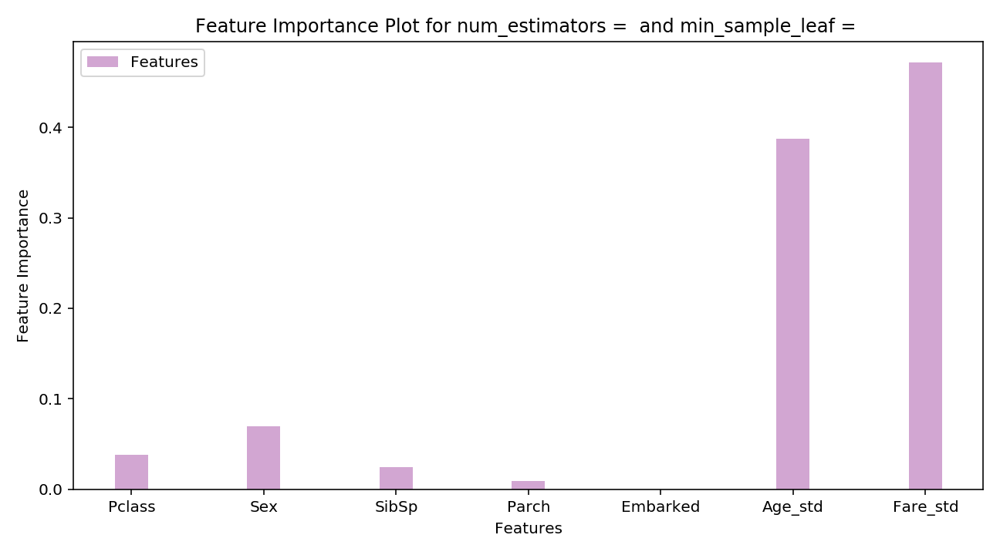

In [177]:
# Feature importance plot
# Figure size
plt.figure(figsize = (9, 5)) 

# Number of bars          
n_groups = len(best_feature_importance)

# Visual style
index = np.arange(n_groups)
bar_width = 0.25


rects1 = plt.bar(index, best_feature_importance, bar_width,
                 alpha=0.35, color='purple', 
                 label='Features')

# Labels, Title, and legends
plt.xlabel("Features")
plt.ylabel('Feature Importance')
plt.title("Feature Importance Plot for num_estimators =  and min_sample_leaf = ")
plt.xticks(index, features)
plt.legend()

plt.tight_layout()
plt.show()

In [178]:
## Data
Y = X_data_["Survived"]
X = X_data_.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

GB_clf = GradientBoostingClassifier(n_estimators=1, min_samples_leaf=61)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
GB_clf.fit(X_train, Y_train)
predict_labels = GB_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))

Test Accuracy of decision tree is 0.5734265734265734


### Gradient Boosting with Nans

In [171]:
# 10-fold Cross-validation for both n_estimators and min-samples_leaf hyperparameters
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)

## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
from sklearn.model_selection import KFold

# Random seed: reproducibility
np.random.seed(0)

# Data
Y = Y_train
X = X_train

# K-folds value
k = 10


## Max depth list
n_estimators = np.arange(1, 1000, 200) 

# MinSampleLeaf
min_sample_leaf = np.arange(1, 101, 3) 

# storing relevant information
train_accuracy = [[[0 for i in range(k)] for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]
test_accuracy = [[[0 for i in range(k)] for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]
mean_train_accs = [[0 for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]
mean_test_accs = [[0 for j in range(len(n_estimators))] for m in range(len(min_sample_leaf ))]

best_test_acc = 0
best_train_acc = 0

global_best_test = 0
global_best_test_ne = 0
global_best_test_ms = 0

global_best_train = 0
global_best_train_ne = 0
global_best_train_ms = 0

best_n_estimators_train = 0
best_n_estimators_test = 0

best_mean_test_acc = 0
best_mean_train_acc = 0

best_feature_importance = []

best_iter = 0
best_params_iter = 0
best_neiter_train= 0
best_neiter_test= 0

# BestMDMSIter = 0
# BestMDMSTest = 0
# BestMDMSTrain = 0

# Niters
cviter = 0
msiter = 0
neiter = 0

# CV loop
kf = KFold(n_splits = k, shuffle = True)

for ms in min_sample_leaf:
    print("------------------------- Min Sample Leaf ", ms, "-------------------------")
    neiter = 0
    for ne in n_estimators:
        print("------------------------- n_estimators", ne, "-------------------------")
        cviter = 0
        best_test_acc = 0
        best_train_acc = 0
        ## Create sets for cross validation
        for train_index, test_index in kf.split(X):
            print("------------------ Iteration", cviter + 1, "------------------")
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]

            # Calling the function
            GB_clf = GradientBoostingClassifier(n_estimators=ne, min_samples_leaf=ms)
            GB_clf.fit(X_train, y_train)
            # Computing Accuracy for test and train set
            # Training Accuracy value
            train_accuracy[msiter][neiter][cviter] = GB_clf.score(X = X_train, y = y_train) 

            # Testing Accuracy value
            test_accuracy[msiter][neiter][cviter]= GB_clf.score(X = X_test, y = y_test) 

            # Best RMSE
            if test_accuracy[msiter][neiter][cviter] > best_test_acc:
                best_test_acc = test_accuracy[msiter][neiter][cviter]
#                 best_max_depth = md
                best_iter = cviter
#                 best_mditer = mditer
                best_feature_importance  = GB_clf.feature_importances_

            #print(niters,iiters)
            print("CV Iteration Results")
            print("-------------------- Accuracy --------------------")
            print("Training set:", train_accuracy[msiter][neiter][cviter])
            print("Test set:", test_accuracy[msiter][neiter][cviter])
            print("--------------------------------------------------")
            ## Next cv iteration
            cviter +=1

        ## Storing mean test and training accuracy values from cv
        mean_test_accs[msiter][neiter] =  np.mean(test_accuracy[msiter][neiter])
        mean_train_accs[msiter][neiter] =  np.mean(train_accuracy[msiter][neiter])
        
        print("\n\nSummary 10-fold Cross-validation for num_estimators", ne)
        print("---------------------------------------")
        print("Average Accuracy training:",mean_train_accs[msiter][neiter])
        print("Average Accuracy testing:", mean_test_accs[msiter][neiter])
        print("Best Accuracy (test):", best_test_acc, "on iteration", 
              best_iter + 1)
        print("Importance of features best accuracy (test):\n", 
              best_feature_importance)
        print("---------------------------------------\n\n")

        # Best AVG accuracy (train & test)
        if mean_train_accs[msiter][neiter] > best_mean_train_acc:
            best_mean_train_acc = mean_train_accs[msiter][neiter]
            best_n_estimators_train = ne
            global_best_train_ne = ne
            global_best_train_ms = ms
            best_neiter_train = neiter

        if mean_test_accs[msiter][neiter] > best_mean_test_acc:
            best_mean_test_acc = mean_test_accs[msiter][neiter]
            best_n_estimators_test = ne
            global_best_test_ne = ne
            global_best_test_ms = ms
            best_neiter_test = neiter

        # Next md  iteration
        neiter += 1
        
     # storing Max Depth results
    print("\n\nSummary num_estimators =", ne, "Min Sample leaf =", ms, "Results")
    print("---------------------------------------")
    print("Best num_estimators(training data):", n_estimators[best_neiter_train])
    print("Best Accuracy (training data):", best_mean_train_acc)
    print("Best num_estimators (test data):", n_estimators[best_neiter_test])
    print("Best Accuracy (test data):", best_mean_test_acc)
    print("---------------------------------------")
    
    # Next ms  iteration
    msiter += 1
        
# Final results
print("\n\nGlobal  Results")
print("---------------------------------------")
print("Best num_estimators (training data):", global_best_train_ne)
print("Best Min Sample Leaf (training data):", global_best_train_ms)
print("Best Accuracy (training data):", best_mean_train_acc)
print("Best num_estimators (test data):", global_best_test_ne)
print("Best Min Sample Leaf (test data):", global_best_test_ms)
print("Best Accuracy (test data):", best_mean_test_acc)
print("---------------------------------------")

------------------------- Min Sample Leaf  1 -------------------------
------------------------- n_estimators 1 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.594679186228482
Test set: 0.5972222222222222
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.596875
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.590625
Test set: 0.6338028169014085
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.590625
Test set: 0.6338028169014085
----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9045383411580594
Test set: 0.5138888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9015625
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.90625
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9046875
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9342723004694836
Test set: 0.5277777777777778
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.93125
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.934375
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.946875
Test set: 0.4225352112676056
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.92

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9499217527386542
Test set: 0.4861111111111111
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.94375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.946875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.940625
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.953

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8403755868544601
Test set: 0.5138888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8515625
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.846875
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.84375
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.85

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9123630672926447
Test set: 0.4305555555555556
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.90625
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.909375
Test set: 0.6338028169014085
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9140625
Test set: 0.43661971830985913
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9327073552425665
Test set: 0.5833333333333334
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.925
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9453125
Test set: 0.38028169014084506
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9296875
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7511737089201878
Test set: 0.5277777777777778
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7453125
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7546875
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7515625
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set:

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.863849765258216
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.853125
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8609375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.840625
Test set: 0.6338028169014085
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8796875
Test set:

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9078125
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8921875
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.9078125
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8890625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8890625

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7543035993740219
Test set: 0.5277777777777778
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7453125
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.728125
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.725
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7437

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8435054773082942
Test set: 0.4861111111111111
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.859375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8265625
Test set: 0.6056338028169014
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8234375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8826291079812206
Test set: 0.4861111111111111
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.89375
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.884375
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.88906

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7417840375586855
Test set: 0.5972222222222222
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7265625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7390

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8184663536776213
Test set: 0.5277777777777778
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.834375
Test set: 0.38028169014084506
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8390625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.82

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.86697965571205
Test set: 0.5972222222222222
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8765625
Test set: 0.4225352112676056
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.88125
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8765625
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.729264475743349
Test set: 0.6388888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7078125
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7140625
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.72

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8200312989045383
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8171875
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.821875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.834375
Test set: 0.43661971830985913
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8203125
Test s

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8716744913928013
Test set: 0.5138888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.85625
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8625
Test set: 0.4084507042253521
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.85
Test

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7073552425665102
Test set: 0.5555555555555556
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7171875
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.721875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.734375
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7965571205007824
Test set: 0.5277777777777778
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8015625
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.81875
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.815625
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.82

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8544600938967136
Test set: 0.4583333333333333
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.84375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.85
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8484375
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.84375


Test set: 0.4583333333333333
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7078125
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7234375
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7125
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.815625
Test set: 0.647887323943662
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8109375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.80625
Test set: 0.6197183098591549
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.803125
Test set: 0.39436619718309857
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8
Test set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8484375
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.84375
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8484375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8375
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 6 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8359375
Test

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.701095461658842
Test set: 0.5416666666666666
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7203125
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6859375
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.690625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8075117370892019
Test set: 0.5694444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8015625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7921875
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8
Test set: 0.4084507042253521
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.79531

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.838810641627543
Test set: 0.5138888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.840625
Test set: 0.6056338028169014
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.834375
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.84375
Test set: 0.676056338028169
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.83437

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5984375
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6015625
Test set: 0.5352112676056338
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1
---------------------------------------
Average Accuracy training: 0.5949371576682316
Average Accuracy testing: 0.5949726134585289
Best Accuracy (test): 0.6901408450704225 on iteration 3
Importance of features best accuracy (test):
 [0.         0.         0.07519008 0.         0.         0.53394845
 0.39086146]
---------------------------------------


------------------------- n_estimators 201 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ----------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7640625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76875
Test set: 0.5352112676056338
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 601
---------------------------------------
Average Accuracy training: 0.773714299687011
Average Accuracy testing: 0.5077856025039124
Best Accuracy (test): 0.6056338028169014 on iteration 6
Importance of features best accuracy (test):
 [0.04749581 0.03896502 0.05237907 0.04620722 0.03424097 0.3806181
 0.40009381]
---------------------------------------


------------------------- n_estimators 801 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ------------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.815625
Test set: 0.43661971830985913
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8234375
Test set: 0.5070422535211268
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1201
---------------------------------------
Average Accuracy training: 0.8177829127543037
Average Accuracy testing: 0.5021713615023474
Best Accuracy (test): 0.5774647887323944 on iteration 3
Importance of features best accuracy (test):
 [0.03941504 0.05592628 0.05556997 0.03318247 0.05337211 0.38659119
 0.37594294]
---------------------------------------


------------------------- n_estimators 1401 -------------------------
------------------ Iteration 1 ------------------
CV Iteration Results
-------------------- Accuracy ------------

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8578125
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.834375
Test set: 0.5211267605633803
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1801
---------------------------------------
Average Accuracy training: 0.8476342429577464
Average Accuracy testing: 0.5035406885758997
Best Accuracy (test): 0.6338028169014085 on iteration 3
Importance of features best accuracy (test):
 [0.04085594 0.0562493  0.04649288 0.03592408 0.03602924 0.39049989
 0.39394868]
---------------------------------------




Summary num_estimators = 1801 Min Sample leaf = 37 Results
---------------------------------------
Best num_estimators(training data): 1801
Best Accuracy (training data): 0.94592967

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.73125
Test set: 0.4225352112676056
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7328125
Test set: 0.43661971830985913
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 401
---------------------------------------
Average Accuracy training: 0.7385526701877934
Average Accuracy testing: 0.4936032863849765
Best Accuracy (test): 0.5633802816901409 on iteration 4
Importance of features best accuracy (test):
 [0.03983891 0.04909393 0.04955993 0.03421099 0.03457909 0.38201714
 0.41070001]
---

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.784375
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.796875
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.790625
Test set: 0.4788732394366197
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1001
---------------------------------------
Average Accuracy training: 0.7932482394366198
Average Accuracy testing: 0.4936619718309859
Best Accuracy (test): 0.5352112676056338 on iteration 2
Importance of features best accuracy (test):
 [0.02726597 0.06379955 0.0508437  0.04717665 0.03741018 0.36529591
 0.40820804]
--

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8265625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8421875
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.846875
Test set: 0.4225352112676056
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1601
---------------------------------------
Average Accuracy training: 0.8277851134585289
Average Accuracy testing: 0.5035015649452269
Best Accuracy (test): 0.6056338028169014 on iteration 4
Importance of features best accuracy (test):
 [0.02436121 0.06612173 0.04837003 0.04060418 0.05566012 0.37888386
 0.38599887]


CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6921875
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6890625
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.678125
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6875
Test set: 0.5352112676056338
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 201
---------------------------------------
Average Accuracy training: 0.6905780516431925
Aver

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7765625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7609375
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7796875
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7609375
Test set: 0.5633802816901409
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 801
---------------------------------------
Average Accuracy training: 0.7696513106416275
A

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8140625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.821875
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8140625
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7984375
Test set: 0.5352112676056338
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1401
---------------------------------------
Average Accuracy training: 0.8098161189358372
A

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6964006259780907
Test set: 0.5277777777777778
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6953125
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6875
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6890625
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7668231611893583
Test set: 0.5694444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7875
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7671875
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75468

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8075117370892019
Test set: 0.5416666666666666
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8
Test set: 0.43661971830985913
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.796875
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8109375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.79687

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.704225352112676
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.684375
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.696875
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6765625
Test set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7621283255086072
Test set: 0.4722222222222222
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7640625
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7671875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7965571205007824
Test set: 0.5416666666666666
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.790625
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.8015625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7953125
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6744913928012519
Test set: 0.6111111111111112
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68125
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68125
Test set: 0.647887323943662
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.678125
Tes

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7527386541471048
Test set: 0.4444444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7515625
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7515625
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7609375
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7856025039123631
Test set: 0.4722222222222222
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.790625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7953125
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.790625
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.672926447574335
Test set: 0.5833333333333334
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.690625
Test set: 0.4225352112676056
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.675
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6875


CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7449139280125195
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75625
Test set: 0.6197183098591549
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.75
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7546875
Test set: 0.577464

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7793427230046949
Test set: 0.6111111111111112
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76875
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7796875
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7796875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6885758998435054
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6921875
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6859375
Test set: 0.4084507042253521
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6703125
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.68125
Test set

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7386541471048513
Test set: 0.4305555555555556
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.734375
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7375
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7390625
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.72

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7746478873239436
Test set: 0.5138888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.775
Test set: 0.43661971830985913
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7515625
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7734375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

-------------------- Accuracy --------------------
Training set: 0.6635367762128326
Test set: 0.6111111111111112
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.671875
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6859375
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.66875
Test set: 0.6338028169014085
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.684375
Test set: 0.5633

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7370892018779343
Test set: 0.4861111111111111
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7171875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7171875
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7296875
Test set: 0.4507042253521127
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7652582159624414
Test set: 0.5694444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7625
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7796875
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7640625
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6635367762128326
Test set: 0.6111111111111112
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.671875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6671875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6578125
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.730829420970266
Test set: 0.5555555555555556
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7375
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7296875
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7421875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.72

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7464788732394366
Test set: 0.625
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7484375
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.74375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.74375
Test set: 0.6197183098591549
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.76875
Test set: 

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.676056338028169
Test set: 0.5
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6640625
Test set: 0.6056338028169014
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6671875
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.65
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.65625
Test set: 0.54

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7355242566510172
Test set: 0.5694444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7328125
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.725
Test set: 0.43661971830985913
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7171875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7480438184663537
Test set: 0.5694444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7625
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7515625
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7578125
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6604068857589984
Test set: 0.4861111111111111
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.659375
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.653125
Test set: 0.6901408450704225
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.66875
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.679

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7104851330203443
Test set: 0.5694444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7296875
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7203125
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7480438184663537
Test set: 0.5138888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7421875
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7453125
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7390625
Test set: 0.6338028169014085
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.5921875
Test set: 0.6197183098591549
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.590625
Test set: 0.6338028169014085
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.59375
Test set: 0.6056338028169014
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1
---------------------------------------
Average Accuracy training: 0.5949361795774648
Average Accuracy testing: 0.5948943661971829
Best Accuracy (test): 0.6338028169014085 on iteration 9
Importance of features best accuracy (test):
 [0.         0.         0.26845903 0.         0.         0.73154097
 0.        ]
-----

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7140625
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.709375
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.703125
Test set: 0.6056338028169014
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 601
---------------------------------------
Average Accuracy training: 0.7074550078247261
Average Accuracy testing: 0.538810641627543
Best Accuracy (test): 0.6197183098591549 on iteration 5
Importance of features best accuracy (test):
 [0.04331579 0.06282896 0.07202479 0.01976446 0.04587231 0.36842893
 0.38776476]
--

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7390625
Test set: 0.5070422535211268
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7546875
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7390625
Test set: 0.5774647887323944
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1201
---------------------------------------
Average Accuracy training: 0.7368348982785603
Average Accuracy testing: 0.5499217527386542
Best Accuracy (test): 0.6197183098591549 on iteration 7
Importance of features best accuracy (test):
 [0.03975309 0.06491773 0.05217303 0.03550839 0.03355421 0.34027469
 0.43381887]

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7484375
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7484375
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.759375
Test set: 0.6056338028169014
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1801
---------------------------------------
Average Accuracy training: 0.7530863654147104
Average Accuracy testing: 0.5232394366197183
Best Accuracy (test): 0.6338028169014085 on iteration 6
Importance of features best accuracy (test):
 [0.05379279 0.07437229 0.05709814 0.04503862 0.02151561 0.32298025
 0.42520229]


CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6734375
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6609375
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.690625
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6796875
Test set: 0.5915492957746479
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 401
---------------------------------------
Average Accuracy training: 0.6821390845070423
A

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7234375
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7109375
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.709375
Test set: 0.5633802816901409
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7203125
Test set: 0.6056338028169014
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1001
---------------------------------------
Average Accuracy training: 0.720425469483568
Av

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.73125
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.74375
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.74375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7421875
Test set: 0.5070422535211268
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1601
---------------------------------------
Average Accuracy training: 0.7429293818466354
Averag

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.640625
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6640625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.653125
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6625
Test set: 0.5352112676056338
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 201
---------------------------------------
Average Accuracy training: 0.6555721830985916
Averag

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7078125
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.696875
Test set: 0.6056338028169014
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.690625
Test set: 0.5070422535211268
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 801
---------------------------------------
Average Accuracy training: 0.7007357687793427
Average A

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7203125
Test set: 0.5915492957746479
--------------------------------------------------
------------------ Iteration 8 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7390625
Test set: 0.5492957746478874
--------------------------------------------------
------------------ Iteration 9 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.71875
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 10 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.740625
Test set: 0.43661971830985913
--------------------------------------------------


Summary 10-fold Cross-validation for num_estimators 1401
---------------------------------------
Average Accuracy training: 0.729799735915493
Ave

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.647887323943662
Test set: 0.5694444444444444
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6484375
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6515625
Test set: 0.6056338028169014
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.6390625
Test set: 0.5352112676056338
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.704225352112676
Test set: 0.5416666666666666
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.70625
Test set: 0.4788732394366197
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.690625
Test set: 0.49295774647887325
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.70625
Test set: 0.5774647887323944
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7
Te

CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7402190923317684
Test set: 0.5138888888888888
--------------------------------------------------
------------------ Iteration 2 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7078125
Test set: 0.6197183098591549
--------------------------------------------------
------------------ Iteration 3 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7296875
Test set: 0.5211267605633803
--------------------------------------------------
------------------ Iteration 4 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0.7265625
Test set: 0.4647887323943662
--------------------------------------------------
------------------ Iteration 5 ------------------
CV Iteration Results
-------------------- Accuracy --------------------
Training set: 0

In [174]:
## Running algorithm on tuned parameter
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)
## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

GB_clf = GradientBoostingClassifier(n_estimators=1, min_samples_leaf=89)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
GB_clf.fit(X_train, Y_train)
predict_labels = GB_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))

Test Accuracy of decision tree is 0.5898876404494382


### Discussion:
#### How does the GBM performance compare to the other models?Create a figure showing the feature importances in your final model (with properly tuned hyperparameters)

From the above random forest analysis, after 10 fold cross validation on number of estimator/trees we obtain the following results:

Global  Results
- Best num_estimators (training data): 801
- Best Min Sample Leaf (training data): 1
- Best Accuracy (training data): 0.9562583759746589
- Best num_estimators (test data): 1
- Best Min Sample Leaf (test data): 61
- Best Accuracy (test data): 0.5924812030075188

Importance of features best accuracy (test):
 [0.01882566 0.06680632 0.01427685 0.04622555 0.00939227 0.49307307
 0.35140026]

#### Test Results
Test Accuracy of decision tree is 0.5734265734265734
 
Looking at GBM including NANs we obtain the following results:
 
Global  Results
- Best num_estimators (training data): 1801
- Best Min Sample Leaf (training data): 1
- Best Accuracy (training data): 0.9459296752738655
- Best num_estimators (test data): 1
- Best Min Sample Leaf (test data): 89
- Best Accuracy (test data): 0.5950704225352113

#### Test Results
Test Accuracy of decision tree is 0.5898876404494382

### 3.3 Feature Engineering
Revisit the features in your dataset.
* Are each of the features being appropriately included in the analysis? 
* Find a way to engineer meaningful features from the "Name" and/or "Cabin" fields in the data.
* Create a final table that summarizes the performance of your models 

In [179]:
# Enter your code here
data = data_train.copy()
data = data[["Cabin","Pclass", "Sex", "Age", "SibSp", 
             "Parch", "Fare", "Embarked", "Survived"]]
data['Age_std'] = data['Age'] / np.max(data['Age'])
data['Fare_std'] = data['Fare']/np.max(data['Fare'])
data= data.drop([ "Age", "Fare"], axis = 1)
temp =np.round(np.mean(X_data_['Age_std']),4)
data['Age_std'] = data['Age_std'].fillna(temp)

## data cleaning for improperly filled data
data['Cabin'] = data['Cabin'].replace(["C23 C25 C27", "F G73",'D10 D12','B58 B60','D','C22 C26','B57 B59 B63 B66'],
                                      ['C23', 'G73','D10','B58', 'D0','C22','B57'])
data['Cabin'] = data['Cabin'].replace(['B51 B53 B55','F G63','C62 C64','B82 B84','F E69','B96 B98','T'],
                                      ['B51','G63','C62','B82','E69','B96','T0'])

## Convert first letter of cabin to number using ord function and saving to temp data columns
ord_lst = []
for ii in data.Cabin.str[0]:
 
    if pd.notna(ii):
        num = ord(ii)
        ord_lst.append(num)
    else:
        ord_lst.append(ii)
data['temp']= np.array(ord_lst)
data.temp  = data.temp.fillna(0)

## Extracting string without first letter and converting to integer
data.Cabin = data.Cabin.str[1:]
data.Cabin  = data.Cabin.fillna('999')
data.Cabin = data.Cabin.astype(int)
## set data cabin value to product of temp and cabin number minus letter
data['Cabin_std'] = data.Cabin* data.temp
## normalising cabin value
data['Cabin_std'] = data['Cabin_std']/np.max(data['Cabin_std'])

## dropping excess colums
data = data.drop(['Cabin','temp'], axis=1)
data = data.dropna()

data.describe()

,Pclass,Sex,SibSp,Parch,Embarked,Survived,Age_std,Fare_std,Cabin_std
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,2.311586,0.350956,0.524184,0.382452,0.362205,0.382452,0.370521,0.062649,0.076613
std,0.834700,0.477538,1.103705,0.806761,0.636157,0.486260,0.162104,0.097003,0.182528
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005250,0.000000,0.000000
25%,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.275000,0.015412,0.000000
50%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.370500,0.028213,0.000000
75%,3.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.437500,0.060508,0.000000
max,3.000000,1.000000,8.000000,6.000000,2.000000,1.000000,1.000000,1.000000,1.000000


### Random forest with new cabin features and filled nan values

In [168]:
## Running algorithm on tuned parameter
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)
## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

RF_clf = RandomForestClassifier(criterion='entropy',  n_estimators=2601)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
RF_clf.fit(X_train, Y_train)
predict_labels = RF_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))


Test Accuracy of decision tree is 0.7696629213483146


### GBF with new cabin features and filled nan values

In [180]:
## Running algorithm on tuned parameter
## Data
Y = data["Survived"]
X = data.drop(["Survived"], axis = 1)
## split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

GB_clf = GradientBoostingClassifier(n_estimators=1, min_samples_leaf=89)
# params: n_estimators=100 (number of trees in the forest), criterion (eg entropy),
# max_features how many features at each split defualt max_features=sqrt(n_features)
GB_clf.fit(X_train, Y_train)
predict_labels = GB_clf.predict(X_test)
print("Test Accuracy of decision tree is {}".format(sum(predict_labels==Y_test)/len(Y_test)))

Test Accuracy of decision tree is 0.5898876404494382


### Discussion
#### Are each of the features being appropriately included in the analysis?
From the analysis, there seems to be an emphasis on the $Age_std$ and $Fare_std$ features and in some models the $Sex$ variable also seems relevant. Because there is a significant number of missing values for the age variable, we may be missing some key  information about the agie distribution which may be useful for predicting. In 2.5 we saw that replacing these values by the mean age only slighly improves the algorithm. there are also some variables like $Name$ and $Cabin$ that were not added into the analysis which may provide more information. I also suspected that people with siblings or parents were more likeely to either survive or perish together but that was not really reflected in my model results as the SipSp variable was not of great importance in most of the above models:
#### Find a way to engineer meaningful features from the "Name" and/or "Cabin" fields in the data.

In the above analysis, I created a feature for Cabin by first setting all the NAN values to a big numerica category of 999. Then I converted the first character of the cabin number to a letter which is a string character to a numeric value using the ord function and saves to a temp column in the dataframe. then I converted the remaining string to integers and I multiplied the new string cabin column to the temp column to create a unique number for each uniwur cabin. then I nornamlised the new cabin column and added to my features.

#### Create a final table that summarizes the performance of your models as follows:

| Model | Cross-validated Performance   | Test Performance | 
|------|------|------|
|   Decision Tree (md=2)       |0.5853  |0.7832  |
|   Decision Tree (md=1,ms=)       |0.6022  |0.7932  |
|   Decision Tree (with imputed missing values and new features)        | 0.5949 |0.7191  |
|   SVM (C=121) | 0.5924 | 0.7902 |
|   SVM (with imputed missing values and new features)        | 0.5951 |0.7191  |
|   Random Forest        |0.5615  | 0.8182 |
|   Random Forest (with imputed missing values )        | 0.5043 | 0.7528  |
|   Random Forest (with imputed missing values and new Cabin feature)        | n/a |  0.7696 |
|   Gradient Boosting    |0.5924 | 0.5734 | 
|   Gradient Boosting (with imputed missing values)        |0.5950  | 0.5899   |
|   Gradient Boosting (with imputed missing values and new Cabin feature)        | n/a |   0.5899 |

From the results we note that adding the new cabin feature and using all data including nans, although it underperforms when compared to the default model that excludes nans for reasons that we have suggested in the above analysis, it performs  better for  random forests when compared to the model that just uses all data without the cabin data. However the results are very similar for the GBM model. This suggested that the cabin data could be an important factor for prediction. Of course more analysis and cross validation needs to be done to confirm this hypothesis.


## Part 4 (extra credit): Neural Networks

###  Let's get familiar with neural networks!
Now, try to predict survival on the Titanic using feed forward neural networks. This will likely be easiest with [TensorFlow](https://www.tensorflow.org/), as highlighted in the lab section.

For this problem, you are responsible for choosing the number of layers, their corresponding size, the activation functions, and the choice of gradient descent algorithm (and its parameters e.g. learning rate). Pick those parameters by hand. For some of them you can also perform cross-validation if you wish. Your goal is to tune those parameters so that your test accuracy is higher than 83%. Make sure you process your data appropriately before training your networks.

* Report your accuracy on the test set along with your choice of parameters. More specifically, report the number of layers, their size, the activation functions and your choice of optimization algorithm. 

* It is a good exercise to experiment with different optimizers (gradient descent, stochastic gradient descent, AdaGrad etc), learning rates and batch sizes to get a feeling of how they affect neural network training. No need to report anything here. 


In [ ]:
# Enter your code here
import tensorflow as tf